# Generate SynthPop Fields and Compare with BRAVA

The important configuration parts for the SynthPop fields are:
- Galactic model: Huston 2025
- Extinction map: Surot with project_3d=true and dist_2d=8.15
- Extinction law: SODC with R_V=2.5
- Mag. Lim.: 2MASS_Ks > 12 removed

References:  
- [BRAVA I](https://ui.adsabs.harvard.edu/abs/2007ApJ...658L..29R/abstract)  
- [BRAVA II](https://ui.adsabs.harvard.edu/abs/2012AJ....143...57K/abstract)  
- [Koshimoto 2021](https://ui.adsabs.harvard.edu/abs/2021ApJ...917...78K/abstract) -- has some discussion of BRAVA

Things to consider:
- Is it the magnitudes? Need to double-check what they're using + I'm using obsmag:True, which I think may mean it's apparent and I might need to de-redden?
- Is there a positional thing? Since it seems to be symmetric? BRAVA gives what they use for x,y,z to go from HC -> GC, so I wonder if I need to give those same coordinates to SynthPop? But then what do I use for u,v,w? Check paper to see if those are there.
- Should I cut synthpop for M giants? I would think the other cuts I've implemented would get it "close enough," but maybe not.

In [1]:
from pathlib import Path
import sys

from scipy.stats import binned_statistic, median_abs_deviation
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
from scipy.stats import norm
import matplotlib as mpl
import pandas as pd
import numpy as np
import yaml

synthdir = f"{Path.home()}/synthpop"
sys.path.insert(0, synthdir)
import synthpop as sp

## Setup

Note: Surot limits are -10 < *l* < 10 and -10 < _b_ < 5.

In [2]:
#datadir = "/home/ast-gaudi-group/crisp/synthpop/BRAVA_kinematics_testing"
datadir = "/fs/project/gaudi.1/crisp/synthpop/BRAVA_kinematics_testing"
catdir = f"{datadir}/catalogs/BRAVA_test"
tabdir = f"{datadir}/tables"
plotdir = f"{datadir}/plots"

config = f"{synthdir}/synthpop/config_files/BRAVA_test.synthpop_conf"

In [3]:
# Set flag on whether to (re)generate catalogs
generate_catalogs = 0 # 0 if no, 1 if yes
generate_sp_gaussians = 0
generate_brava_table = 0

solang0 = 0.01
max_solang = 0.05
min_stars = 100

In [4]:
# Strings for labels
vgcstr = r"V$_{GC}$"
vbcstr = r"V$_{BC}$"
vhcstr = r"V$_{HC}$"
dispstr = r"$\sigma$"

In [5]:
def filter_for_surot(dataframe, l_key='l', b_key='b'):
    dataframe = dataframe[(dataframe[l_key] >= -10.0) &
                          (dataframe[l_key] <= 10.0) &
                          (dataframe[b_key] >= -10.0) &
                          (dataframe[b_key] <= 5.0)]
    dataframe.reset_index(drop=True, inplace=True)
    return dataframe

### Create Discrete Colormap

For plotting the fields color-coded by *b*

In [6]:
colors = ["#882E72", "#1965B0", "#7BAFDE", "#4EB265", "#CAE0AB", 
          "#F7F056", "#F4A736", "#E8601C", "#DC050C", "#72190E"]

bounds = [-8.0, -7.0, -6.0, -5.0, -4.0, -3.5, -3.0, -2.0, -1.0, 4.0] # from listing unique b's

In [7]:
cmap = mpl.colors.ListedColormap(colors)
cmap_norm = mpl.colors.BoundaryNorm(bounds, ncolors=len(colors))

### Check Main BRAVA Table

In [8]:
brava_main = pd.read_csv(f"{tabdir}/BRAVA_Main_Table.no_dup.txt", sep=r'\s+', header=0)
print(brava_main)
print(brava_main.columns.values)
# Need to change the two 0,-4 fields...

    l_deg  b_deg  mean_Vgc  err_mean_Vgc  sigma  err_sigma   Na     Nb
0       0    4.0       7.7          11.6  112.9        8.2   95   95.0
1       0   -1.0       5.8          15.0  135.4       10.6   82   97.0
2       0   -2.0      -8.1          12.1  125.8        8.6  108    NaN
3      -6   -3.0     -58.0          11.5   91.0        8.1   63    NaN
4       0   -3.0     -20.4          11.9  121.6        8.4  105  107.0
..    ...    ...       ...           ...    ...        ...  ...    ...
75      6   -8.0      51.0           7.4   72.7        5.2   98    NaN
76      7   -8.0      47.4           7.6   76.2        5.3  102    NaN
77      8   -8.0      58.1           6.9   68.5        4.9   98    NaN
78      9   -8.0      54.9           7.0   72.2        4.9  108    NaN
79     10   -8.0      79.5           7.5   73.6        5.3   96    NaN

[80 rows x 8 columns]
['l_deg' 'b_deg' 'mean_Vgc' 'err_mean_Vgc' 'sigma' 'err_sigma' 'Na' 'Nb']


In [9]:
print(brava_main.shape)
brava_main = filter_for_surot(brava_main, l_key='l_deg', b_key='b_deg')
print(brava_main.shape)

(80, 8)
(76, 8)


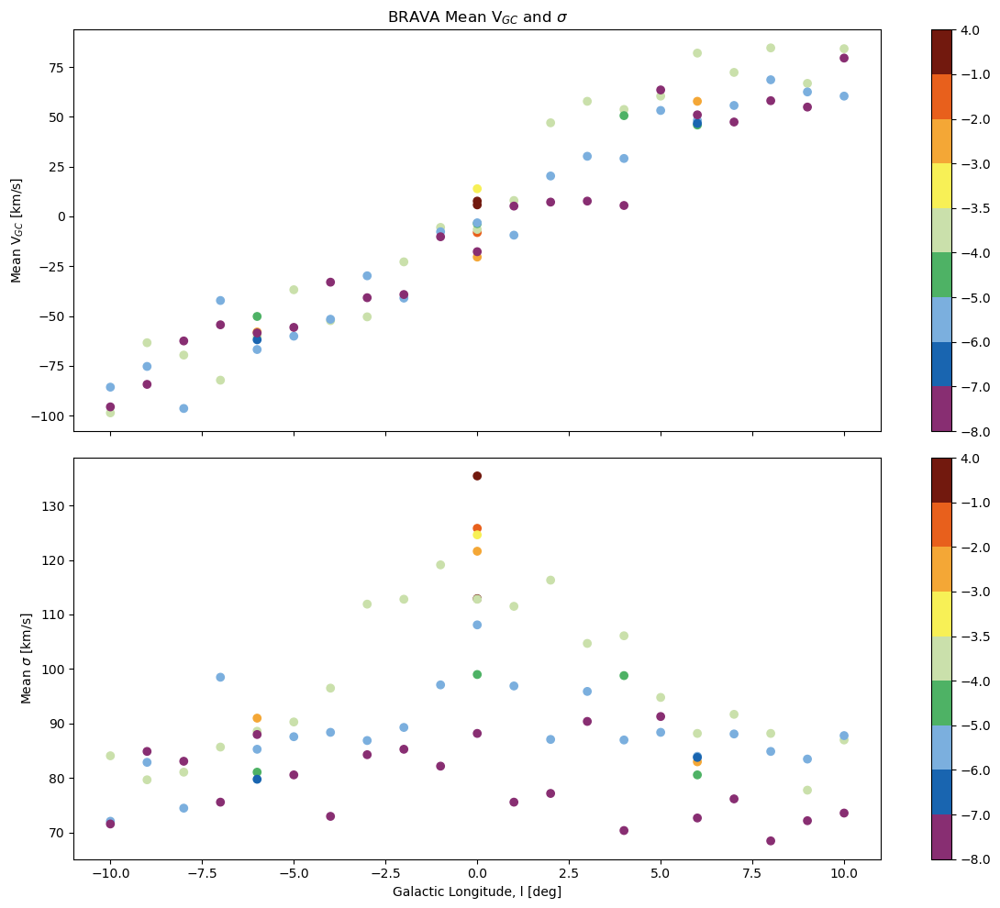

In [10]:
fig, axs = plt.subplots(2, 1, sharex=True, figsize=(12,10))

axs[0].set_title(f"BRAVA Mean {vgcstr} and {dispstr}")
sc0 = axs[0].scatter(brava_main['l_deg'], brava_main['mean_Vgc'], c=brava_main['b_deg'], cmap=cmap, norm=cmap_norm)
axs[0].set_ylabel(f"Mean {vgcstr} [km/s]")

sc1 = axs[1].scatter(brava_main['l_deg'], brava_main['sigma'], c=brava_main['b_deg'], cmap=cmap, norm=cmap_norm)
axs[1].set_xlabel("Galactic Longitude, l [deg]")
axs[1].set_ylabel(f"Mean {dispstr} [km/s]")

plt.colorbar(sc0)
plt.colorbar(sc1)
plt.tight_layout()

### Load Tables From Paper I and Paper II, Combine

In [11]:
if generate_brava_table == 1:
    b1 = pd.read_csv("brava_i_tab4.txt", sep='\\s+', header=0)
    print(b1.columns)
    b2 = pd.read_csv("brava_ii_tab1.txt", sep='\\s+', header=0)
    print(b2.columns)

    b1.columns = ['field', 'l', 'b', 'V_hc', 'V_gc', 'err_V', 'sigma', 'err_sigma', 'N_fibers',
                  'N_reliable_vel']
    b1.drop(columns=['field'], inplace=True)
    
#     b1.drop(columns=['field', 'N_fibers', 'N_reliable_vel'], inplace=True) #fibers = Na reliable = Nb
#     print(b1.columns)
#     b2.drop(columns=['N_fibers', 'N_reliable_vel'], inplace=True)
#     print(b2.columns)

    brava_combined = pd.concat([b1,b2])
    brava_combined.reset_index(drop=True, inplace=True)
    print(brava_combined)

    brava_combined.to_csv(f"BRAVA_combined_tables.txt", sep=' ', header=True, index=False, na_rep='NaN')

## Plot All the CMDs from BRAVA to Get Idea of Mag Limit

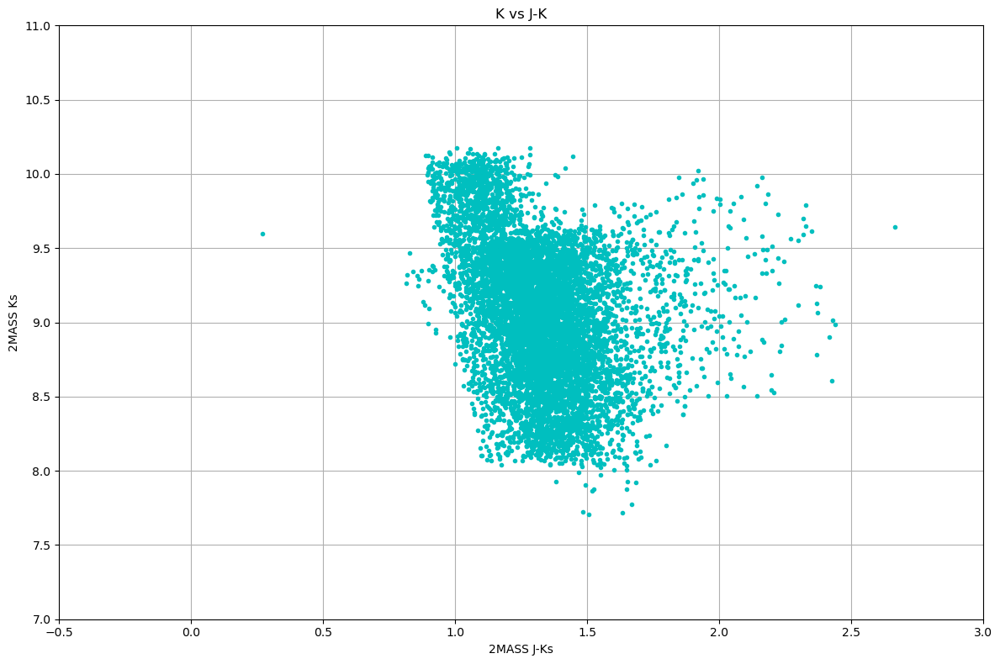

In [12]:
fig, ax = plt.subplots(figsize=(12,8))

for i, row in brava_main.iterrows():
    tab = pd.read_csv(f"{tabdir}/BRAVA_l{row['l_deg']:0.3f}_b{row['b_deg']:0.3f}.table", sep=r'\s+', header=0)
    ax.plot(tab.loc[:,'J']-tab.loc[:,'K'], tab.loc[:,'K'], 'c.')

ax.set_title('K vs J-K')
ax.grid()
ax.set_xlabel('2MASS J-Ks')
ax.set_xlim(-0.5, 3.0)
ax.set_ylabel('2MASS Ks')
ax.set_ylim(7.0,11.0)
plt.tight_layout()

## Instantiate SP Model + Create Catalogs (if not done previously)

In [13]:
if generate_catalogs == 1:
    model = sp.SynthPop(default_config=config)
    model.init_populations()
    for i, row in brava_main.iterrows():
        solang = solang0
        df, dist = model.process_location(row['l_deg'], row['b_deg'], solang)

        num_bright = df[df.loc[:,'2MASS_Ks'] <= 10].shape[0]
        print(f"     Number of stars Ks<10 generated on attempt 1: {num_bright}")
        if num_bright < min_stars:
            solang = solang * min_stars/num_bright
            print(f"     Rerunning l={row['l_deg']}, b={row['b_deg']} with new solid angle {solang}")
            df, dist = model.process_location(row['l_deg'], row['b_deg'], solang)
            num_bright = df[df.loc[:,'2MASS_Ks'] <= 10].shape[0]
            print(f"     Number of stars Ks<10 generated on attempt 2: {num_bright}")

In [14]:
# model = sp.SynthPop(default_config=config)
# model.init_populations()
# solang = solang0
# df, dist = model.process_location(0.0, -2.0, solang)

# num_bright = df[df.loc[:,'2MASS_Ks'] <= 10].shape[0]
# print(f"     Number of stars Ks<10 generated on attempt 1: {num_bright}")
# if num_bright < min_stars:
#     solang = solang * min_stars/num_bright
#     print(f"     Rerunning l={row['l_deg']}, b={row['b_deg']} with new solid angle {solang}")
#     df, dist = model.process_location(row['l_deg'], row['b_deg'], solang)
#     num_bright = df[df.loc[:,'2MASS_Ks'] <= 10].shape[0]
#     print(f"     Number of stars Ks<10 generated on attempt 2: {num_bright}")

## Save a Dataframe with SynthPop Mean V, Sigma from Gaussian Fits (if not done previously)

In [15]:
if generate_sp_gaussians == 1:
    means = []
    sigs = []
    for i, row in brava_main.iterrows():
        l = row['l_deg']
        b = row['b_deg']

        synth = pd.read_csv(f"{catdir}/BRAVA_test_l{l:0.3f}_b{b:0.3f}.csv", sep=r'\s+', header=0)

        mean_v_synth, mean_sig_synth = norm.fit(synth['vr_bc'])
        means.append(mean_v_synth)
        sigs.append(mean_sig_synth)

    synth_gauss = pd.DataFrame(list(zip(brava_main['l_deg'], brava_main['b_deg'], means, sigs)))
    synth_gauss.columns = ['l_deg', 'b_deg', 'mean_Vbc', 'sigma']
    print(synth_gauss)

    synth_gauss.to_csv(f"SynthPop_Mean_Velocities.txt", sep=' ', header=True, index=False, na_rep='NaN')

else:
    synth_gauss = pd.read_csv("SynthPop_Mean_Velocities.txt", sep='\\s+', header=0)

### Compare the Means

In [16]:
full_brava = pd.read_csv("BRAVA_combined_tables.round.txt", sep='\\s+', header=0)
print(full_brava.columns.values)

['field' 'l' 'b' 'V_hc' 'V_gc' 'err_V' 'sigma' 'err_sigma' 'N_fibers'
 'N_reliable_vel' 'l_round' 'b_round']


In [17]:
# Filter catalogs outside Surot boundaries
print(full_brava.shape)
full_brava = filter_for_surot(full_brava)
print(full_brava.shape)

print(synth_gauss.shape)
synth_gauss = filter_for_surot(synth_gauss, l_key='l_deg', b_key='b_deg')
print(synth_gauss.shape)

(78, 12)
(73, 12)
(76, 4)
(76, 4)


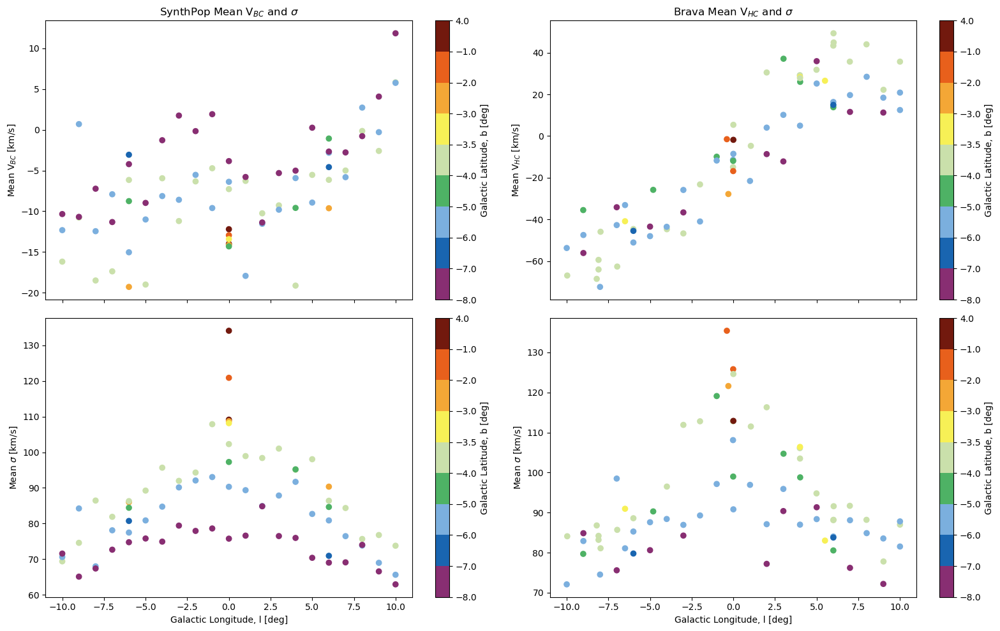

In [18]:
fig, axs = plt.subplots(2, 2, sharex=True, figsize=(16,10))
axs[0,0].set_title(f"SynthPop Mean {vbcstr} and {dispstr}")
sc00 = axs[0,0].scatter(synth_gauss['l_deg'], synth_gauss['mean_Vbc'], c=synth_gauss['b_deg'], cmap=cmap, norm=cmap_norm)
axs[0,0].set_ylabel(f"Mean {vbcstr} [km/s]")

axs[0,1].set_title(f"Brava Mean {vhcstr} and {dispstr}")
sc01 = axs[0,1].scatter(full_brava['l'], full_brava['V_hc'], c=full_brava['b'], cmap=cmap, norm=cmap_norm)
axs[0,1].set_ylabel(f"Mean {vhcstr} [km/s]")

sc10 = axs[1,0].scatter(synth_gauss['l_deg'], synth_gauss['sigma'], c=synth_gauss['b_deg'], cmap=cmap, norm=cmap_norm)
axs[1,0].set_xlabel("Galactic Longitude, l [deg]")
axs[1,0].set_ylabel(f"Mean {dispstr} [km/s]")

sc11 = axs[1,1].scatter(full_brava['l'], full_brava['sigma'], c=full_brava['b'], cmap=cmap, norm=cmap_norm)
axs[1,1].set_xlabel("Galactic Longitude, l [deg]")
axs[1,1].set_ylabel(f"Mean {dispstr} [km/s]")

plt.colorbar(sc00, label='Galactic Latitude, b [deg]')
plt.colorbar(sc01, label='Galactic Latitude, b [deg]')
plt.colorbar(sc10, label='Galactic Latitude, b [deg]')
plt.colorbar(sc11, label='Galactic Latitude, b [deg]')
plt.tight_layout()

## Try Plotting all LoS

https://github.com/synthpop-galaxy/synthpop/blob/2258ce1bed11953a4a1de83bb5769da95ef4c9d8/docs/source/output.rst#L40

### Combine into one dataframe per SP and BRAVA

In [19]:
all_sp = pd.DataFrame()
all_brava = pd.DataFrame()

for i, row in brava_main.iterrows():
    l = row['l_deg']
    b = row['b_deg']
        
    synth = pd.read_csv(f"{catdir}/BRAVA_test_l{l:0.3f}_b{b:0.3f}.csv", sep=r'\s+', header=0)
    brava = pd.read_csv(f"{tabdir}/BRAVA_l{l:0.3f}_b{b:0.3f}.table", sep=r'\s+', header=0)

    all_sp = pd.concat([all_sp, synth])
    all_brava = pd.concat([all_brava, brava])
print(all_sp.shape)
print(all_brava.shape)

(34699, 38)
(7734, 15)


### Plot K vs J-K CMDs

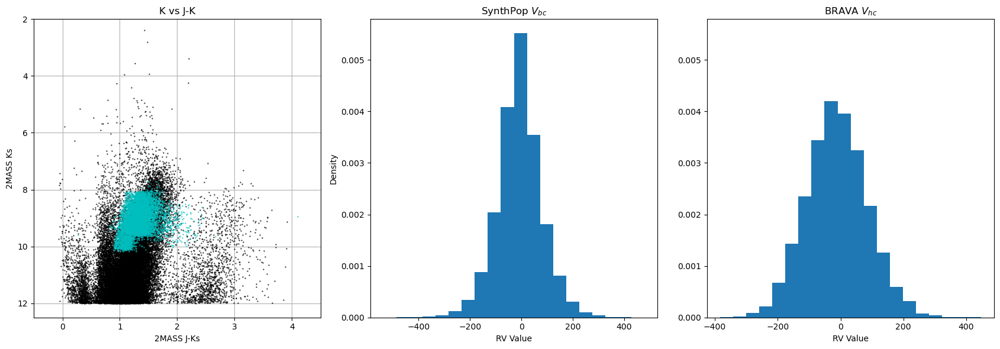

In [20]:
fig, axs = plt.subplots(1, 3, figsize=(17,6))
axs[0].set_title('K vs J-K')
axs[0].plot(all_sp.loc[:,'2MASS_J']-all_sp.loc[:,'2MASS_Ks'], all_sp.loc[:,'2MASS_Ks'], 'k.', ms=1, label='all_spPop')
axs[0].plot(all_brava.loc[:,'J']-all_brava.loc[:,'K'], all_brava.loc[:,'K'], 'c.', ms=1, label='all_brava')
axs[0].grid()
axs[0].set_xlabel('2MASS J-Ks')
axs[0].set_xlim(-0.5, 4.5)
axs[0].set_ylabel('2MASS Ks')
axs[0].set_ylim(2.0, 12.5)
axs[0].invert_yaxis()

axs[1].set_title(r"SynthPop $V_{bc}$")
axs[1].hist(all_sp.loc[:,'vr_bc'], bins=20, density=True)
axs[1].set_xlabel('RV Value')
axs[1].set_ylabel('Density')

axs[2].set_title(r"BRAVA $V_{hc}$")
axs[2].hist(all_brava.loc[:,'Vhc_kmps'], bins=20, density=True)
axs[2].set_xlabel('RV Value')

axs[1].sharey(axs[2])

plt.tight_layout()

### One at a time, actually...

/tmp/slurmtmp.8923088/ipykernel_1960861/548975432.py:47: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 3, figsize=(17,6))


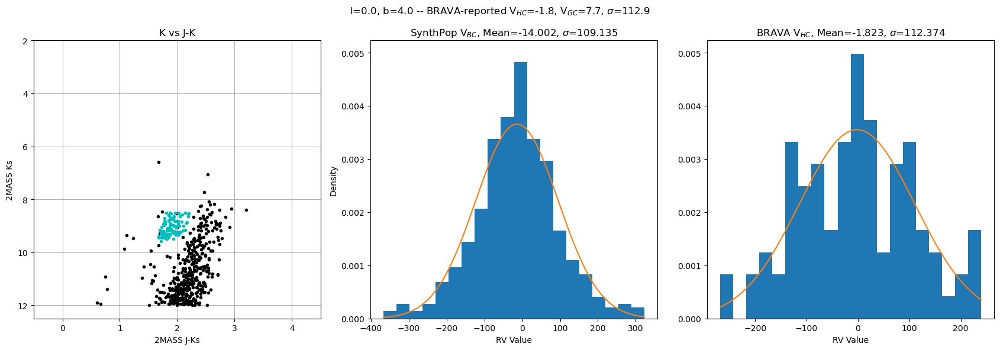

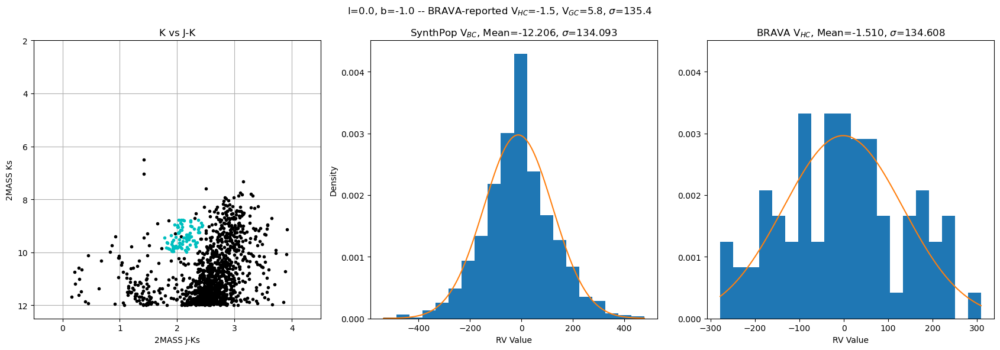

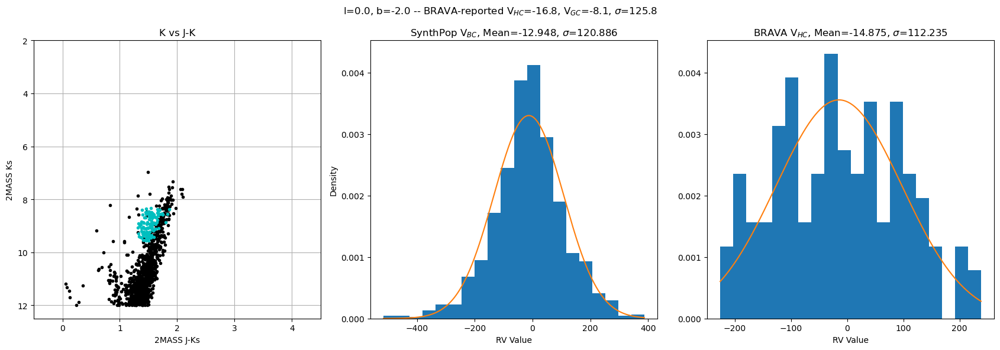

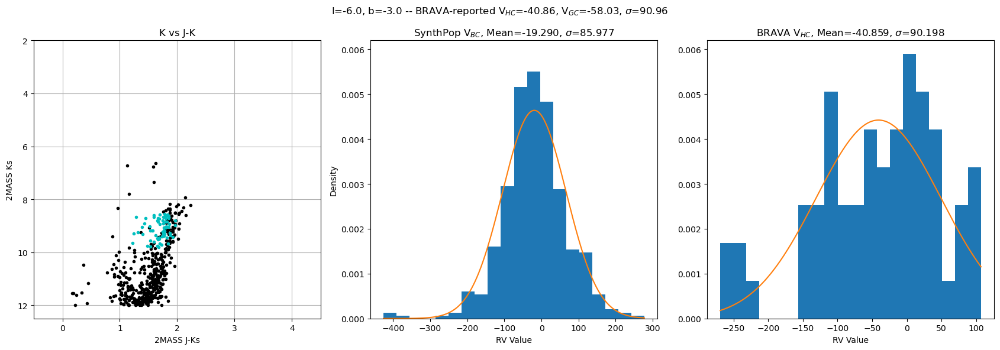

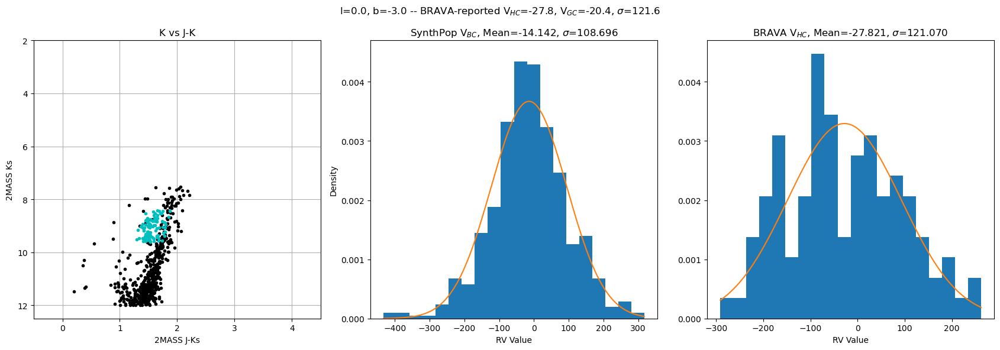

...

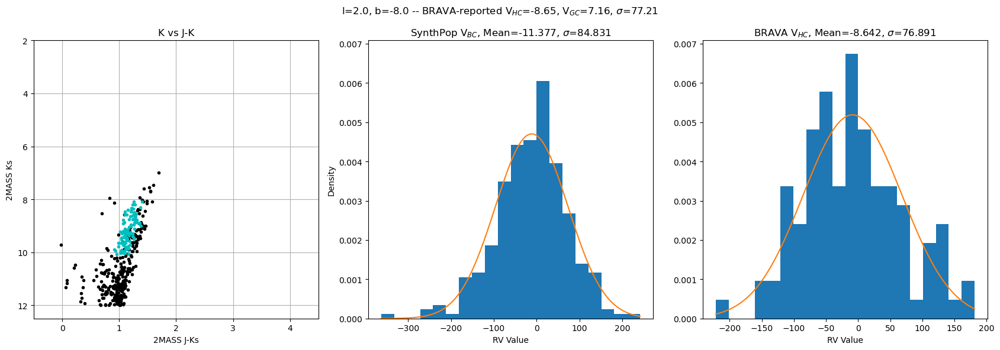

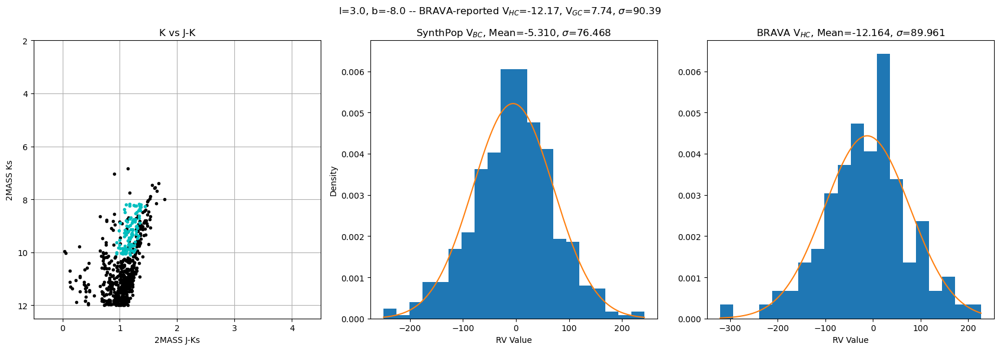

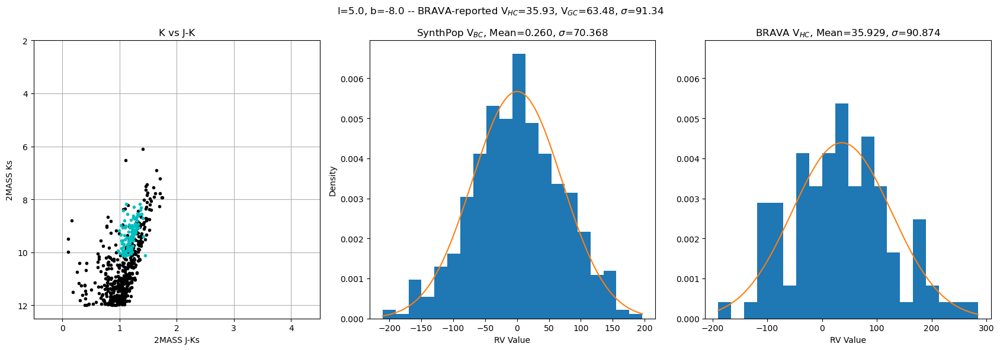

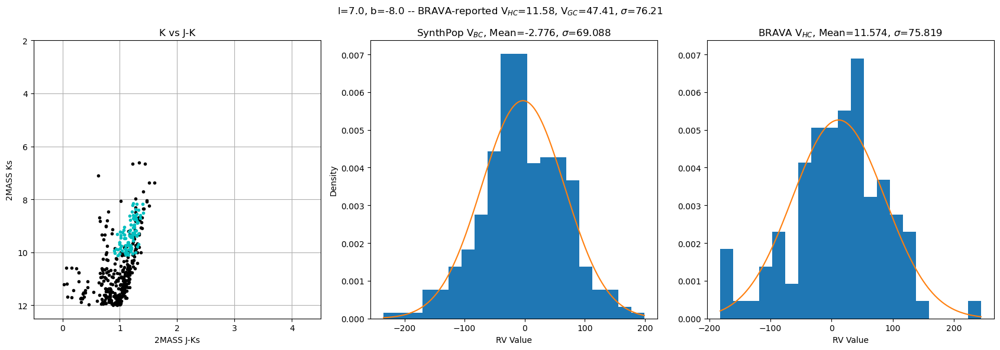

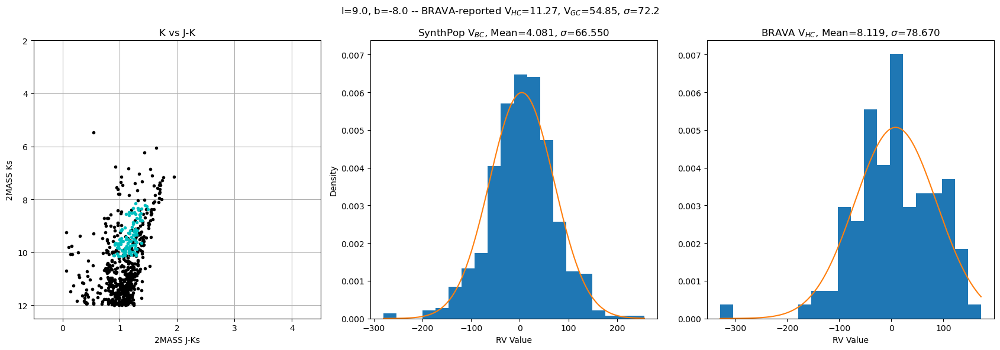

In [21]:
bad = []
rv_dict = {}
for i, row in brava_main.iterrows():
    l = row['l_deg']
    b = row['b_deg']
    
#     print(l)
#     print(b)
    
    from_combined = full_brava[(full_brava['l_round']==l) & (full_brava['b_round']==b)]
    if from_combined.shape[0] > 1:
        main_N = row['Nb']
        from_combined = from_combined[from_combined['N_reliable_vel']==main_N]
    
    if from_combined.shape[0] == 0:
        bad.append(f"{l}_{b}")
        continue
    
    from_combined.reset_index(drop=True, inplace=True)
#     print(type(from_combined['V_hc'][0]))
    
    reported_vhc = from_combined['V_hc'][0]
    reported_vgc = from_combined['V_gc'][0]
    reported_verr = from_combined['err_V'][0]
    reported_sigma = from_combined['sigma'][0]
    reported_sigerr = from_combined['err_sigma'][0]
    
    
    synth = pd.read_csv(f"{catdir}/BRAVA_test_l{l:0.3f}_b{b:0.3f}.csv", sep=r'\s+', header=0)
    #synth = synth[(synth['2MASS_Ks'] >= 8.0) & (synth['2MASS_Ks'] <= 10.0)]
    
    brava = pd.read_csv(f"{tabdir}/BRAVA_l{l:0.3f}_b{b:0.3f}.table", sep=r'\s+', header=0)

    mean_v_synth, mean_sig_synth = norm.fit(synth['vr_bc'])
    xs_synth = np.linspace(synth['vr_bc'].min(), synth['vr_bc'].max(), 1000)
    pdf_synth = norm.pdf(xs_synth, mean_v_synth, mean_sig_synth)
    
    mean_v_brava, mean_sig_brava = norm.fit(brava['Vhc_kmps'])
    xs_brava = np.linspace(brava['Vhc_kmps'].min(), brava['Vhc_kmps'].max(), 1000)
    pdf_brava = norm.pdf(xs_brava, mean_v_brava, mean_sig_brava)
    
    entry = {'l': l, 'b': b, 'brava_vhc': reported_vhc, 'brava_vgc': reported_vgc, 'brava_Verr': reported_verr,
             'brava_sigma': reported_sigma, 'brava_sigerr': reported_sigerr, 
             'synth_vbc': mean_v_synth, 'synth_sigma': mean_sig_synth}
    rv_dict[i] = entry
    
    fig, axs = plt.subplots(1, 3, figsize=(17,6))
    fig.suptitle(f"l={l:0.1f}, b={b:0.1f} -- BRAVA-reported {vhcstr}={reported_vhc}, {vgcstr}={reported_vgc}, {dispstr}={reported_sigma}")
    axs[0].set_title('K vs J-K')
    axs[0].plot(synth.loc[:,'2MASS_J']-synth.loc[:,'2MASS_Ks'], synth.loc[:,'2MASS_Ks'], 'k.', label='SynthPop')
    axs[0].plot(brava.loc[:,'J']-brava.loc[:,'K'], brava.loc[:,'K'], 'c.', label='BRAVA')
    axs[0].grid()
    axs[0].set_xlabel('2MASS J-Ks')
    axs[0].set_xlim(-0.5, 4.5)
    axs[0].set_ylabel('2MASS Ks')
    axs[0].set_ylim(2.0, 12.5)
    axs[0].invert_yaxis()
    
    axs[1].set_title(f"SynthPop {vbcstr}, Mean={mean_v_synth:0.3f}, {dispstr}={mean_sig_synth:0.3f}")
    axs[1].hist(synth.loc[:,'vr_bc'], bins=20, density=True)
    axs[1].plot(xs_synth, pdf_synth)
    axs[1].set_xlabel('RV Value')
    axs[1].set_ylabel('Density')
    
    axs[2].set_title(f"BRAVA {vhcstr}, Mean={mean_v_brava:0.3f}, {dispstr}={mean_sig_brava:0.3f}")
    axs[2].hist(brava.loc[:,'Vhc_kmps'], bins=20, density=True)
    axs[2].plot(xs_brava, pdf_brava)
    axs[2].set_xlabel('RV Value')
    
    axs[1].sharey(axs[2])
    
    plt.tight_layout()
    plt.savefig(f"{plotdir}/synth_brava_l{l:0.3f}_b{b:0.3f}_cmd_hist.png")
    # sys.breakpoint()
    # plt.close()

In [22]:
rv_df = pd.DataFrame.from_dict(rv_dict, orient='index')
display(rv_df)

,l,b,brava_vhc,brava_vgc,brava_Verr,brava_sigma,brava_sigerr,synth_vbc,synth_sigma
0,0.0,4.0,-1.80,7.70,11.60,112.90,8.20,-14.001511,109.135278
1,0.0,-1.0,-1.50,5.80,15.00,135.40,10.60,-12.205721,134.093023
2,0.0,-2.0,-16.80,-8.10,12.10,125.80,8.60,-12.947671,120.886284
3,-6.0,-3.0,-40.86,-58.03,11.46,90.96,8.10,-19.289757,85.976821
4,0.0,-3.0,-27.80,-20.40,11.90,121.60,8.40,-14.141787,108.696135
5,6.0,-3.0,26.54,57.80,8.95,83.02,6.33,-9.628066,90.336070
6,-10.0,-4.0,-66.90,98.60,9.30,84.10,6.60,-16.186736,69.372399
7,-9.0,-4.0,-35.50,-63.40,8.30,79.70,5.80,-10.768702,74.570695
9,-7.0,-4.0,-62.60,-82.20,8.50,85.70,6.00,-17.380294,81.870406
10,-6.0,-4.0,-44.60,-60.40,8.90,88.60,6.30,-6.155393,86.275657


## Try Filtering the SynthPop Data on Magnitude to See if That's the Issue...

/tmp/slurmtmp.8923088/ipykernel_1960861/1253782042.py:47: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 3, figsize=(17,6))


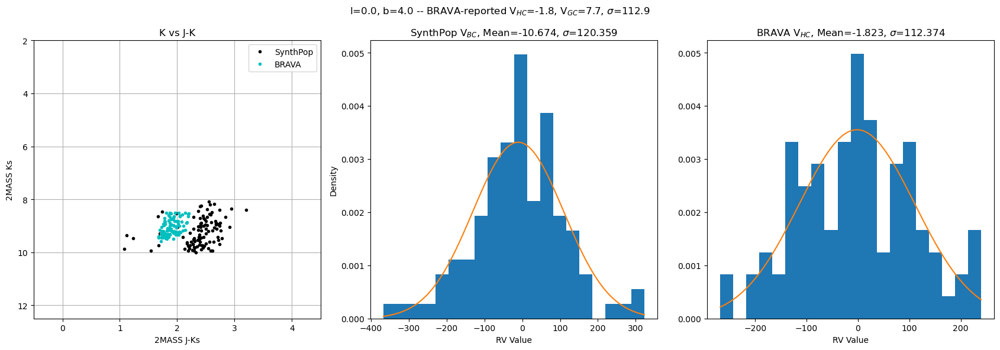

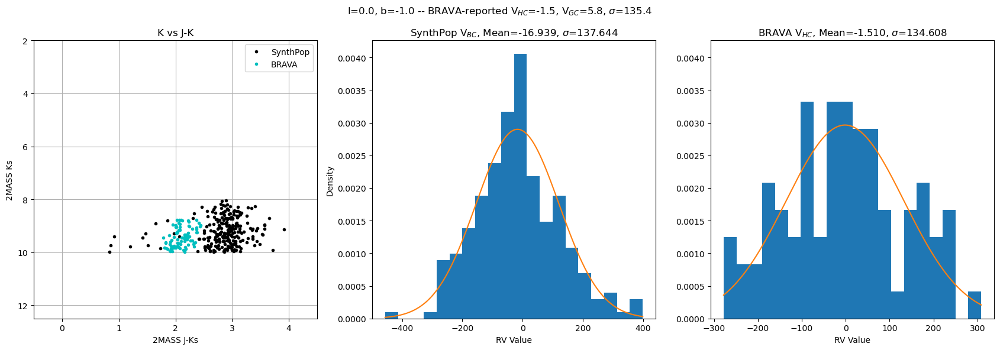

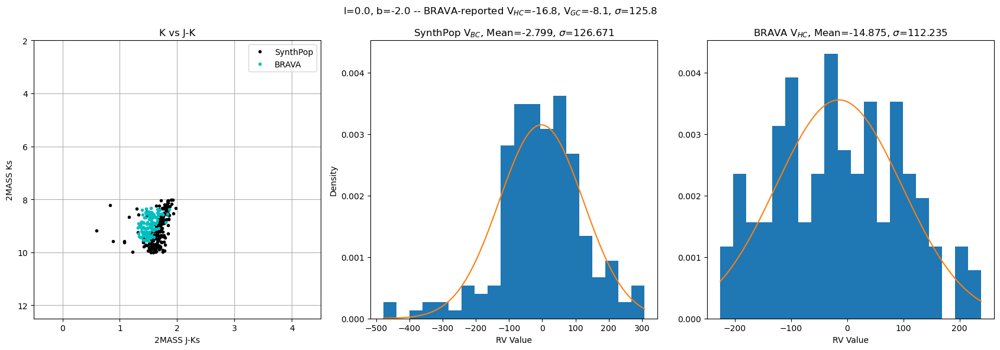

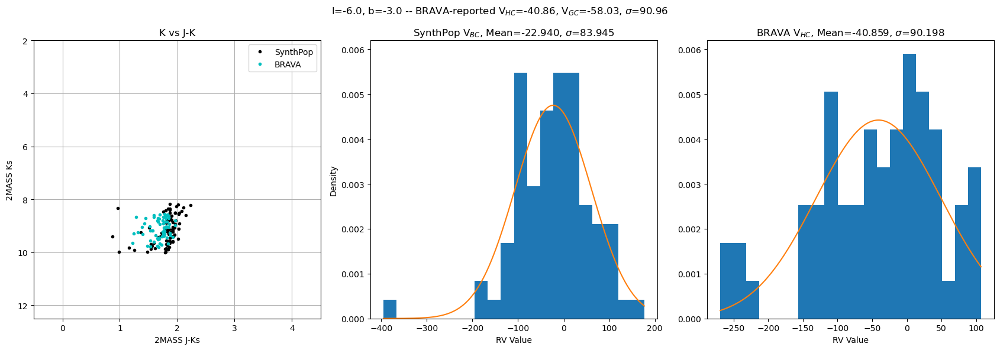

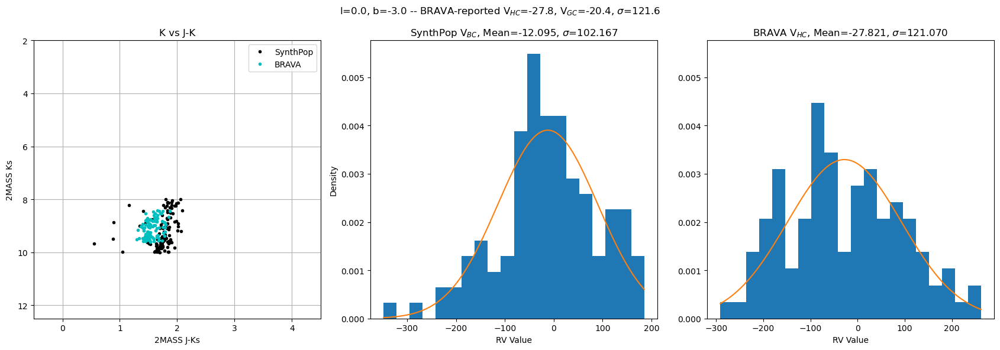

...

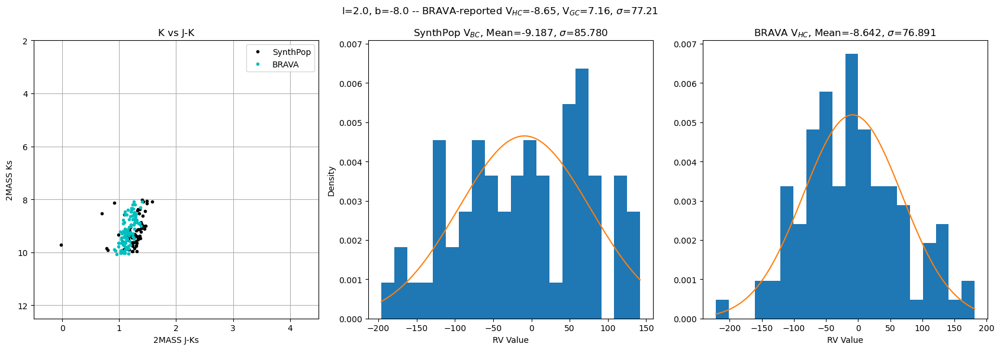

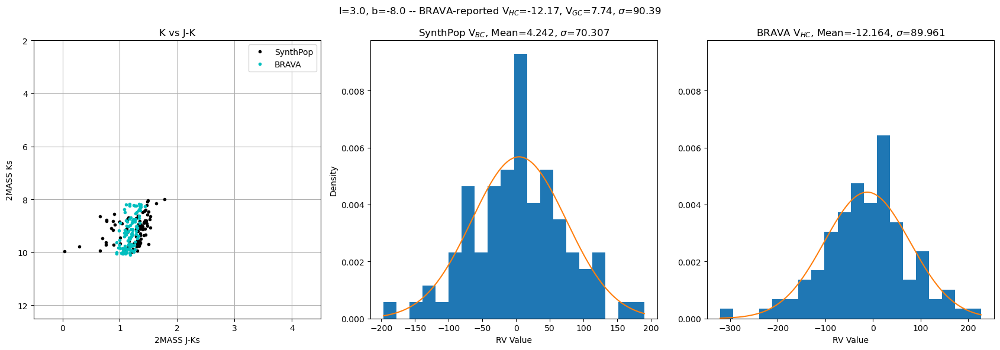

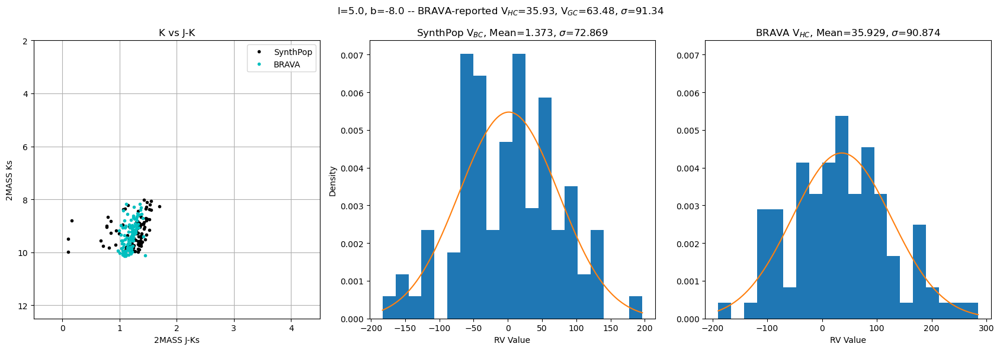

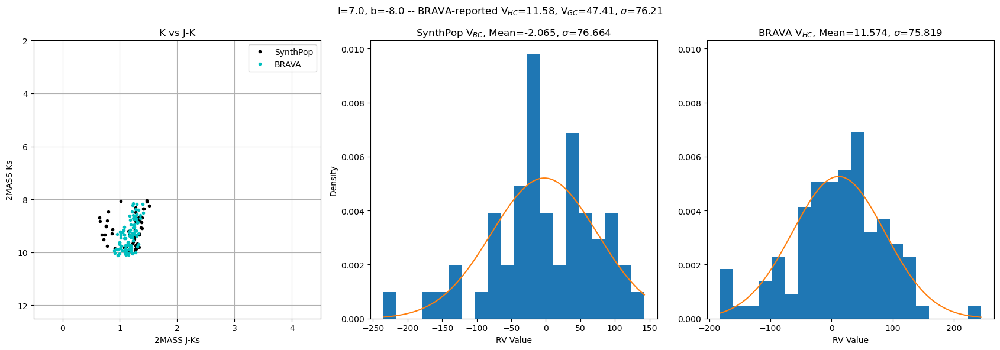

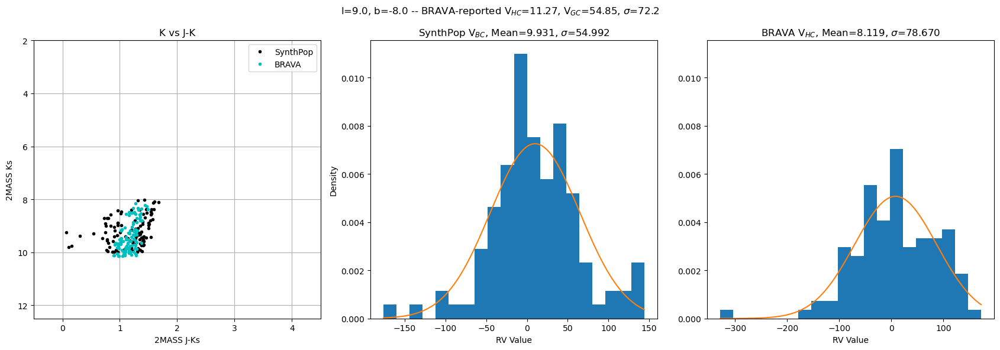

In [23]:
bad = []
rv_dict_magcut = {}
for i, row in brava_main.iterrows():
    l = row['l_deg']
    b = row['b_deg']
    
#     print(l)
#     print(b)
    
    from_combined = full_brava[(full_brava['l_round']==l) & (full_brava['b_round']==b)]
    if from_combined.shape[0] > 1:
        main_N = row['Nb']
        from_combined = from_combined[from_combined['N_reliable_vel']==main_N]
    
    if from_combined.shape[0] == 0:
        bad.append(f"{l}_{b}")
        continue
    
    from_combined.reset_index(drop=True, inplace=True)
#     print(type(from_combined['V_hc'][0]))
    
    reported_vhc = from_combined['V_hc'][0]
    reported_vgc = from_combined['V_gc'][0]
    reported_verr = from_combined['err_V'][0]
    reported_sigma = from_combined['sigma'][0]
    reported_sigerr = from_combined['err_sigma'][0]
    
    
    synth = pd.read_csv(f"{catdir}/BRAVA_test_l{l:0.3f}_b{b:0.3f}.csv", sep=r'\s+', header=0)
    synth = synth[(synth['2MASS_Ks'] >= 8.0) & (synth['2MASS_Ks'] <= 10.0)]
    
    brava = pd.read_csv(f"{tabdir}/BRAVA_l{l:0.3f}_b{b:0.3f}.table", sep=r'\s+', header=0)

    mean_v_synth, mean_sig_synth = norm.fit(synth['vr_bc'])
    xs_synth = np.linspace(synth['vr_bc'].min(), synth['vr_bc'].max(), 1000)
    pdf_synth = norm.pdf(xs_synth, mean_v_synth, mean_sig_synth)
    
    mean_v_brava, mean_sig_brava = norm.fit(brava['Vhc_kmps'])
    xs_brava = np.linspace(brava['Vhc_kmps'].min(), brava['Vhc_kmps'].max(), 1000)
    pdf_brava = norm.pdf(xs_brava, mean_v_brava, mean_sig_brava)
    
    entry = {'l': l, 'b': b, 'brava_vhc': reported_vhc, 'brava_vgc': reported_vgc, 'brava_Verr': reported_verr,
             'brava_sigma': reported_sigma, 'brava_sigerr': reported_sigerr, 
             'synth_vbc': mean_v_synth, 'synth_sigma': mean_sig_synth}
    rv_dict_magcut[i] = entry
    
    fig, axs = plt.subplots(1, 3, figsize=(17,6))
    fig.suptitle(f"l={l:0.1f}, b={b:0.1f} -- BRAVA-reported {vhcstr}={reported_vhc}, {vgcstr}={reported_vgc}, {dispstr}={reported_sigma}")
    axs[0].set_title('K vs J-K')
    axs[0].plot(synth.loc[:,'2MASS_J']-synth.loc[:,'2MASS_Ks'], synth.loc[:,'2MASS_Ks'], 'k.', label='SynthPop')
    axs[0].plot(brava.loc[:,'J']-brava.loc[:,'K'], brava.loc[:,'K'], 'c.', label='BRAVA')
    axs[0].grid()
    axs[0].set_xlabel('2MASS J-Ks')
    axs[0].set_xlim(-0.5, 4.5)
    axs[0].set_ylabel('2MASS Ks')
    axs[0].set_ylim(2.0, 12.5)
    axs[0].invert_yaxis()
    axs[0].legend()
    
    axs[1].set_title(f"SynthPop {vbcstr}, Mean={mean_v_synth:0.3f}, {dispstr}={mean_sig_synth:0.3f}")
    axs[1].hist(synth.loc[:,'vr_bc'], bins=20, density=True)
    axs[1].plot(xs_synth, pdf_synth)
    axs[1].set_xlabel('RV Value')
    axs[1].set_ylabel('Density')
    
    axs[2].set_title(f"BRAVA {vhcstr}, Mean={mean_v_brava:0.3f}, {dispstr}={mean_sig_brava:0.3f}")
    axs[2].hist(brava.loc[:,'Vhc_kmps'], bins=20, density=True)
    axs[2].plot(xs_brava, pdf_brava)
    axs[2].set_xlabel('RV Value')
    
    axs[1].sharey(axs[2])
    
    plt.tight_layout()
    plt.savefig(f"{plotdir}/synth_brava_l{l:0.3f}_b{b:0.3f}_cmd_hist.png")
    # sys.breakpoint()
    # plt.close()

In [24]:
rv_df_magcut = pd.DataFrame.from_dict(rv_dict_magcut, orient='index')
display(rv_df_magcut)

,l,b,brava_vhc,brava_vgc,brava_Verr,brava_sigma,brava_sigerr,synth_vbc,synth_sigma
0,0.0,4.0,-1.80,7.70,11.60,112.90,8.20,-10.674088,120.358538
1,0.0,-1.0,-1.50,5.80,15.00,135.40,10.60,-16.938665,137.644418
2,0.0,-2.0,-16.80,-8.10,12.10,125.80,8.60,-2.798532,126.670789
3,-6.0,-3.0,-40.86,-58.03,11.46,90.96,8.10,-22.940123,83.944669
4,0.0,-3.0,-27.80,-20.40,11.90,121.60,8.40,-12.094712,102.167234
5,6.0,-3.0,26.54,57.80,8.95,83.02,6.33,10.421067,69.117575
6,-10.0,-4.0,-66.90,98.60,9.30,84.10,6.60,-15.006232,62.799448
7,-9.0,-4.0,-35.50,-63.40,8.30,79.70,5.80,-12.104418,85.893993
9,-7.0,-4.0,-62.60,-82.20,8.50,85.70,6.00,-14.251291,73.043178
10,-6.0,-4.0,-44.60,-60.40,8.90,88.60,6.30,-7.632632,81.144883


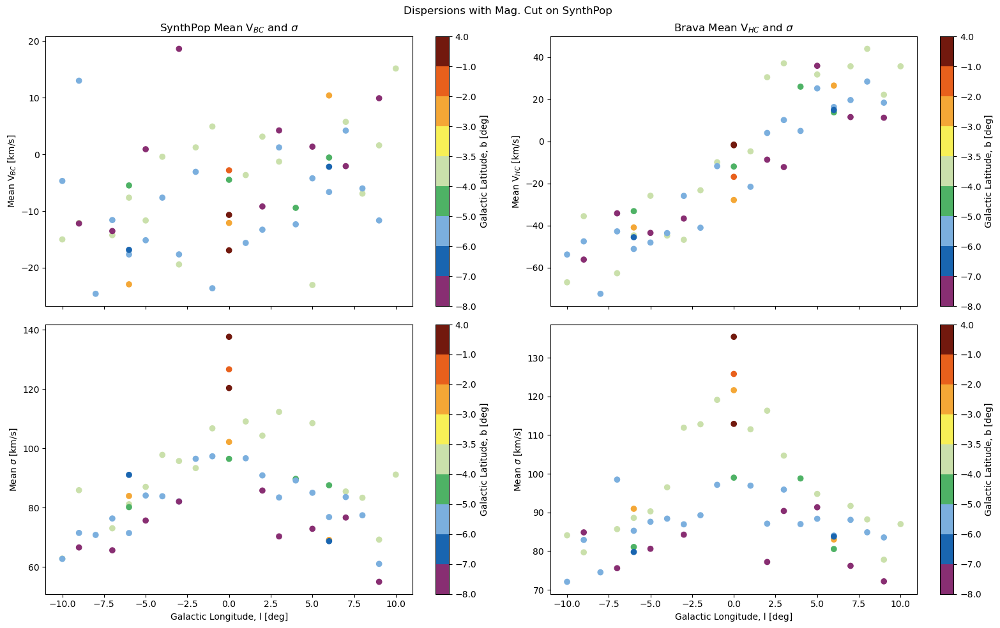

In [25]:
# Try plotting those dispersions again
fig, axs = plt.subplots(2, 2, sharex=True, figsize=(16,10))
fig.suptitle('Dispersions with Mag. Cut on SynthPop')
axs[0,0].set_title(f"SynthPop Mean {vbcstr} and {dispstr}")
sc00 = axs[0,0].scatter(rv_df_magcut['l'], rv_df_magcut['synth_vbc'], c=rv_df_magcut['b'], cmap=cmap, norm=cmap_norm)
axs[0,0].set_ylabel(f"Mean {vbcstr} [km/s]")

axs[0,1].set_title(f"Brava Mean {vhcstr} and {dispstr}")
sc01 = axs[0,1].scatter(rv_df_magcut['l'], rv_df_magcut['brava_vhc'], c=rv_df_magcut['b'], cmap=cmap, norm=cmap_norm)
axs[0,1].set_ylabel(f"Mean {vhcstr} [km/s]")

sc10 = axs[1,0].scatter(rv_df_magcut['l'], rv_df_magcut['synth_sigma'], c=rv_df_magcut['b'], cmap=cmap, norm=cmap_norm)
axs[1,0].set_xlabel("Galactic Longitude, l [deg]")
axs[1,0].set_ylabel(f"Mean {dispstr} [km/s]")

sc11 = axs[1,1].scatter(rv_df_magcut['l'], rv_df_magcut['brava_sigma'], c=rv_df_magcut['b'], cmap=cmap, norm=cmap_norm)
axs[1,1].set_xlabel("Galactic Longitude, l [deg]")
axs[1,1].set_ylabel(f"Mean {dispstr} [km/s]")

plt.colorbar(sc00, label='Galactic Latitude, b [deg]')
plt.colorbar(sc01, label='Galactic Latitude, b [deg]')
plt.colorbar(sc10, label='Galactic Latitude, b [deg]')
plt.colorbar(sc11, label='Galactic Latitude, b [deg]')
plt.tight_layout()

**Narrator voice:** It was not the issue. I may have to figure out how to convert, but real quick since I don't know how to do that, I'm gonna just do the difference between the SynthPop and the BRAVA as a function of location. I'm really wondering if there's a very strong positional dependence on the difference.

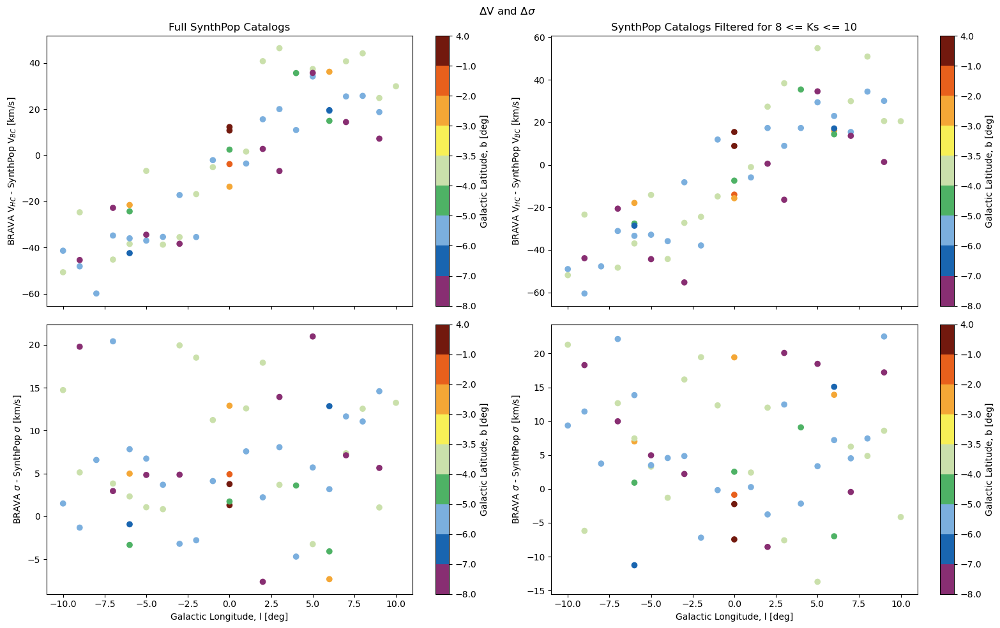

In [26]:
fig, axs = plt.subplots(2, 2, sharex=True, figsize=(16,10))
fig.suptitle(r'$\Delta$V and $\Delta\sigma$')
axs[0,0].set_title('Full SynthPop Catalogs')
sc00 = axs[0,0].scatter(rv_df['l'], rv_df['brava_vhc']-rv_df['synth_vbc'], c=rv_df['b'], cmap=cmap, norm=cmap_norm)
axs[0,0].set_ylabel(f"BRAVA {vhcstr} - SynthPop {vbcstr} [km/s]")

axs[0,1].set_title('SynthPop Catalogs Filtered for 8 <= Ks <= 10')
sc01 = axs[0,1].scatter(rv_df_magcut['l'], rv_df_magcut['brava_vhc']-rv_df_magcut['synth_vbc'], c=rv_df_magcut['b'], cmap=cmap, norm=cmap_norm)
axs[0,1].set_ylabel(f"BRAVA {vhcstr} - SynthPop {vbcstr} [km/s]")

sc10 = axs[1, 0].scatter(rv_df['l'], rv_df['brava_sigma']-rv_df['synth_sigma'], c=rv_df['b'], cmap=cmap, norm=cmap_norm)
axs[1,0].set_xlabel("Galactic Longitude, l [deg]")
axs[1,0].set_ylabel(f"BRAVA {dispstr} - SynthPop {dispstr} [km/s]")

sc11 = axs[1,1].scatter(rv_df_magcut['l'], rv_df_magcut['brava_sigma']-rv_df_magcut['synth_sigma'], c=rv_df_magcut['b'], cmap=cmap, norm=cmap_norm)
axs[1,1].set_xlabel("Galactic Longitude, l [deg]")
axs[1,1].set_ylabel(f"BRAVA {dispstr} - SynthPop {dispstr} [km/s]")

plt.colorbar(sc00, label='Galactic Latitude, b [deg]')
plt.colorbar(sc01, label='Galactic Latitude, b [deg]')
plt.colorbar(sc10, label='Galactic Latitude, b [deg]')
plt.colorbar(sc11, label='Galactic Latitude, b [deg]')
plt.tight_layout()

Might make more sense to do l and b color-coded by the difference?

In [27]:
v_keys = ['c03', 'c06', 'c09', 'c10', 'c12', 'c14', 'c15', 'c17', 'c18', 'c21', 'c24', 'c26']
v_bounds = [-60.0, -50.0, -40.0, -30.0, -20.0, -10.0, 0.0, 10.0, 20.0, 30.0, 40.0, 50.0, 60.0]
sig_keys = ['c10', 'c14', 'c15', 'c17', 'c18', 'c26']
sig_bounds = [-30.0, -20.0, -10.0, 0.0, 10.0, 20.0, 30.0]

color_file = open(f"{Path.home()}/Style_Sheets/python/tol_rainbow_discrete.yaml", 'r')
color_sheet = yaml.safe_load(color_file)
color_file.close()
print(color_sheet)

{'c01': '#E8ECFB', 'c02': '#D9CCE3', 'c03': '#D1BBD7', 'c04': '#CAACCB', 'c05': '#BA8DB4', 'c06': '#AE76A3', 'c07': '#AA6F9E', 'c08': '#994F88', 'c09': '#882E72', 'c10': '#1965B0', 'c11': '#437DBF', 'c12': '#5289C7', 'c13': '#6195CF', 'c14': '#7BAFDE', 'c15': '#4EB265', 'c16': '#90C987', 'c17': '#CAE0AB', 'c18': '#F7F056', 'c19': '#F7CB45', 'c20': '#F6C141', 'c21': '#F4A736', 'c22': '#F1932D c23 : ', 'c24': '#E8601C', 'c25': '#E65518', 'c26': '#DC050C', 'c27': '#A5170E', 'c28': '#72190E', 'c29': '#42150A', 'c30': '#777777'}


In [28]:
v_colors = []
for key in v_keys:
    v_colors.append(color_sheet[key])
    
sig_colors = []
for key in sig_keys:
    sig_colors.append(color_sheet[key])
    
print(v_colors)
print(sig_colors)

['#D1BBD7', '#AE76A3', '#882E72', '#1965B0', '#5289C7', '#7BAFDE', '#4EB265', '#CAE0AB', '#F7F056', '#F4A736', '#E8601C', '#DC050C']
['#1965B0', '#7BAFDE', '#4EB265', '#CAE0AB', '#F7F056', '#DC050C']


In [29]:
cmap_v = mpl.colors.ListedColormap(v_colors)
cmap_norm_v = mpl.colors.BoundaryNorm(v_bounds, ncolors=len(v_colors))

cmap_sig = mpl.colors.ListedColormap(sig_colors)
cmap_norm_sig = mpl.colors.BoundaryNorm(sig_bounds, ncolors=len(sig_colors))

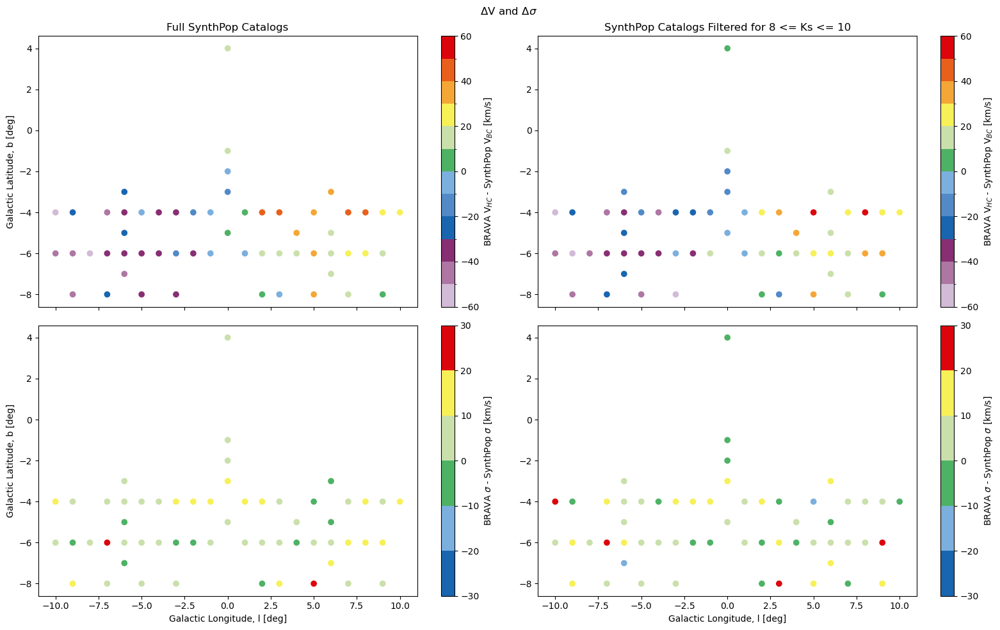

In [30]:
fig, axs = plt.subplots(2, 2, sharex=True, figsize=(16,10))
fig.suptitle(r'$\Delta$V and $\Delta\sigma$')
axs[0,0].set_title('Full SynthPop Catalogs')
sc00 = axs[0,0].scatter(rv_df['l'], rv_df['b'], c=rv_df['brava_vhc']-rv_df['synth_vbc'], cmap=cmap_v, norm=cmap_norm_v)
axs[0,0].set_ylabel("Galactic Latitude, b [deg]")

axs[0,1].set_title('SynthPop Catalogs Filtered for 8 <= Ks <= 10')
sc01 = axs[0,1].scatter(rv_df_magcut['l'], rv_df_magcut['b'], c=rv_df_magcut['brava_vhc']-rv_df_magcut['synth_vbc'], cmap=cmap_v, norm=cmap_norm_v)

sc10 = axs[1, 0].scatter(rv_df['l'], rv_df['b'], c=rv_df['brava_sigma']-rv_df['synth_sigma'], cmap=cmap_sig, norm=cmap_norm_sig)
axs[1,0].set_xlabel("Galactic Longitude, l [deg]")
axs[1,0].set_ylabel("Galactic Latitude, b [deg]")

sc11 = axs[1,1].scatter(rv_df_magcut['l'], rv_df_magcut['b'], c=rv_df_magcut['brava_sigma']-rv_df_magcut['synth_sigma'], cmap=cmap_sig, norm=cmap_norm_sig)
axs[1,1].set_xlabel("Galactic Longitude, l [deg]")


plt.colorbar(sc00, label=f'BRAVA {vhcstr} - SynthPop {vbcstr} [km/s]')
plt.colorbar(sc01, label=f'BRAVA {vhcstr} - SynthPop {vbcstr} [km/s]')
plt.colorbar(sc10, label=f'BRAVA {dispstr} - SynthPop {dispstr} [km/s]')
plt.colorbar(sc11, label=f'BRAVA {dispstr} - SynthPop {dispstr} [km/s]')
plt.tight_layout()

## Impose a Magnitude Cut AND a Color Cut

### Testing

['Aperture' 'l_deg' 'b_deg' 'RA_deg' 'Dec_deg' 'J' 'H' 'K' 'Vhc_kmps'
 'E(B-V)' 'J0' 'H0' 'K0' 'TiO' '2MASS_ID']
[ 8.   8.5  9.   9.5 10. ]


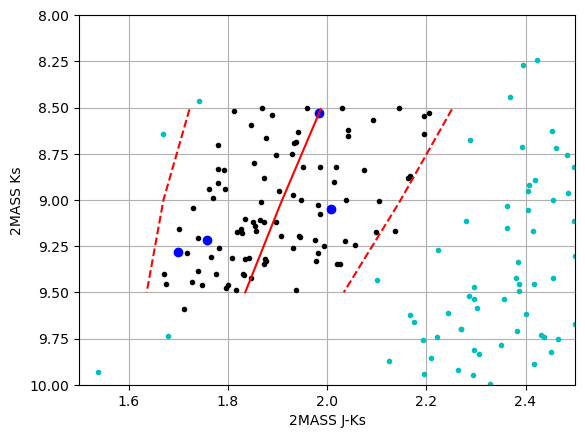

In [31]:
l = 0.0
b = 4.0

synth = pd.read_csv(f"{catdir}/BRAVA_test_l{l:0.3f}_b{b:0.3f}.csv", sep=r'\s+', header=0)
synth = synth[(synth['2MASS_Ks'] >= 8.0) & (synth['2MASS_Ks'] <= 10.0)]

brava = pd.read_csv(f"{tabdir}/BRAVA_l{l:0.3f}_b{b:0.3f}.table", sep=r'\s+', header=0)
print(brava.columns.values)

binrange = [7.75, 10.25]
kbins = [7.75, 8.25, 8.75, 9.25, 9.75, 10.25]

means, edges, binno = binned_statistic(brava['K'], brava['J']-brava['K'], statistic='mean', bins=kbins, range=binrange)
sigmas, _, _ = binned_statistic(brava['K'], brava['J']-brava['K'], statistic='std', bins=kbins, range=binrange)

bc = 0.5*(edges[1:]+edges[:-1])
mags = np.arange(np.min(bc), np.max(bc)+0.01, 0.01)
print(bc)

mag_int = interp1d(bc, means)
std_int = interp1d(bc, sigmas)

synth_cut = synth[np.abs((synth['2MASS_J']-synth['2MASS_Ks'] - mag_int(synth['2MASS_Ks']))) < 2*std_int(synth['2MASS_Ks'])]


fig, ax = plt.subplots()
ax.plot(brava['J']-brava['K'], brava['K'], 'k.')
ax.plot(synth['2MASS_J']-synth['2MASS_Ks'], synth['2MASS_Ks'], 'c.')
ax.plot(synth_cut['2MASS_J']-synth_cut['2MASS_Ks'], synth_cut['2MASS_Ks'], 'bo')
#ax.plot(vals, 0.5*(edges[1:]+edges[:-1]))
#ax.plot(vals+2*mads, 0.5*(edges[1:]+edges[:-1]))
#ax.plot(vals-2*mads, 0.5*(edges[1:]+edges[:-1]))
ax.plot(mag_int(mags), mags, 'r-')
ax.plot(mag_int(mags)+2*std_int(mags), mags, 'r--')
ax.plot(mag_int(mags)-2*std_int(mags), mags, 'r--')
ax.grid()
ax.set_xlabel('2MASS J-Ks')
#ax.set_xlim(-0.5, 4.5)
ax.set_xlim(1.5,2.5)
ax.set_ylabel('2MASS Ks')
#ax.set_ylim(2.0, 12.5)
ax.set_ylim(8.0, 10.0)
ax.invert_yaxis()

/tmp/slurmtmp.8923088/ipykernel_1960861/1837328044.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


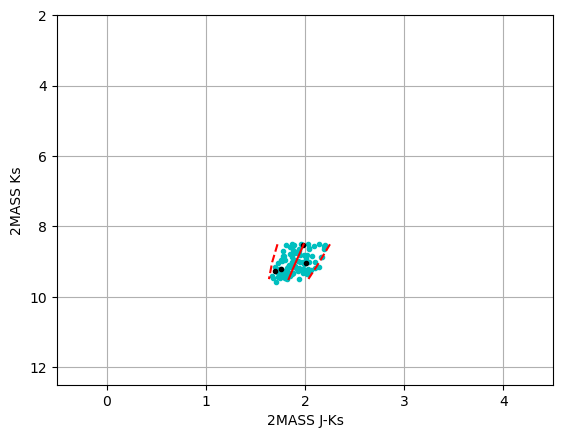

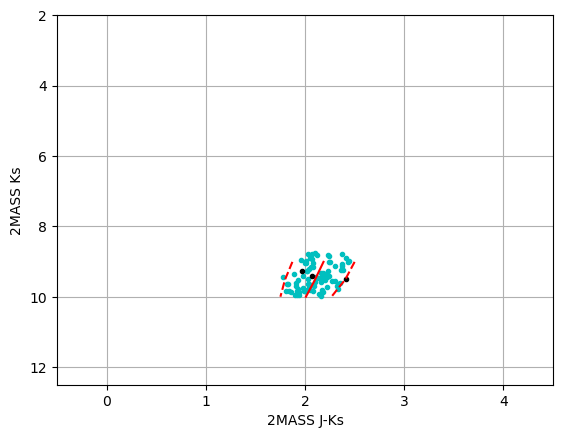

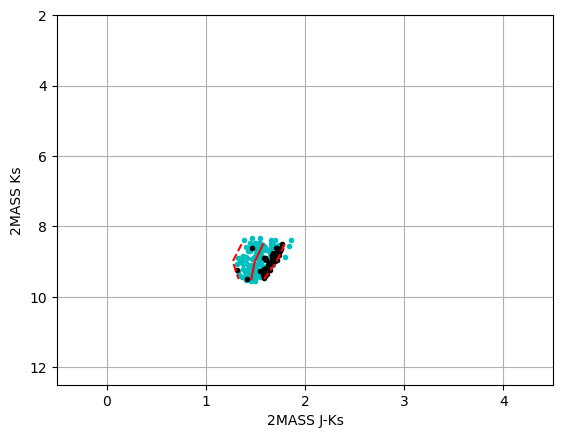

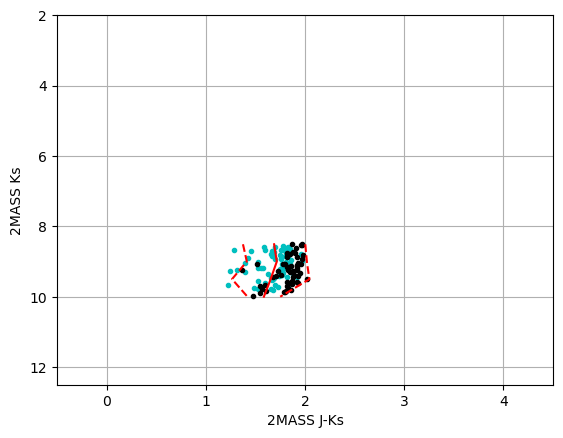

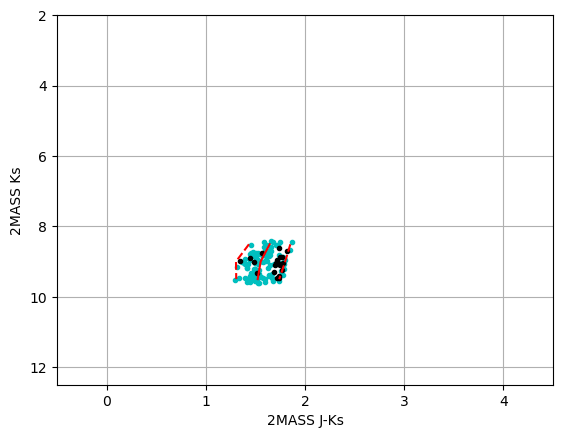

...

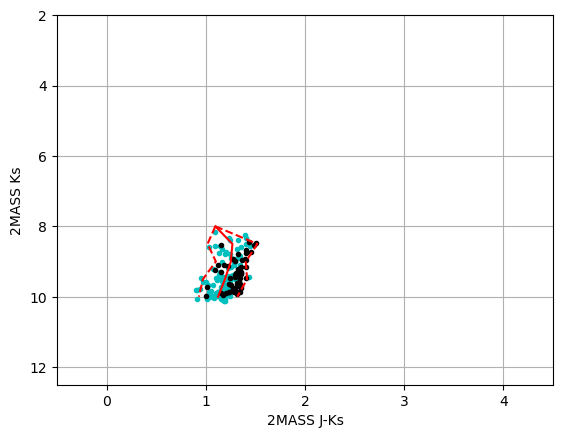

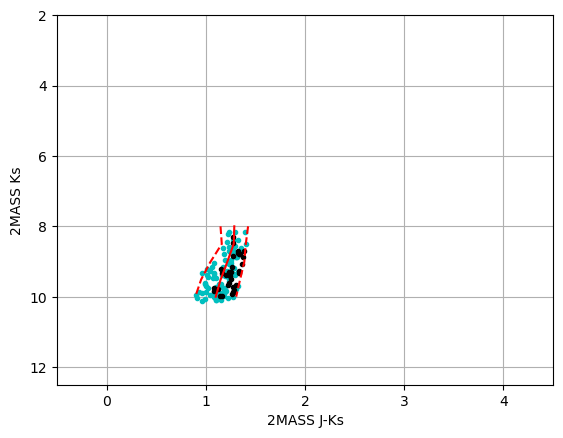

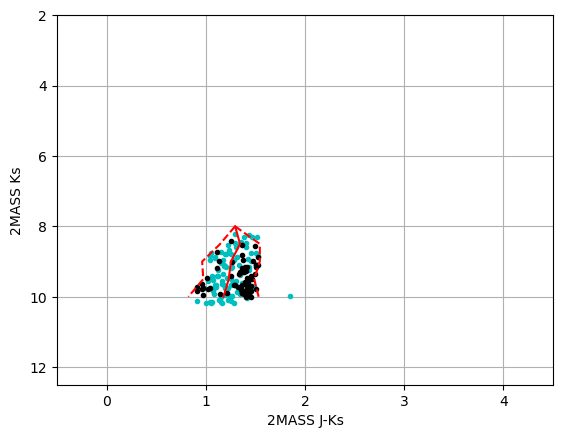

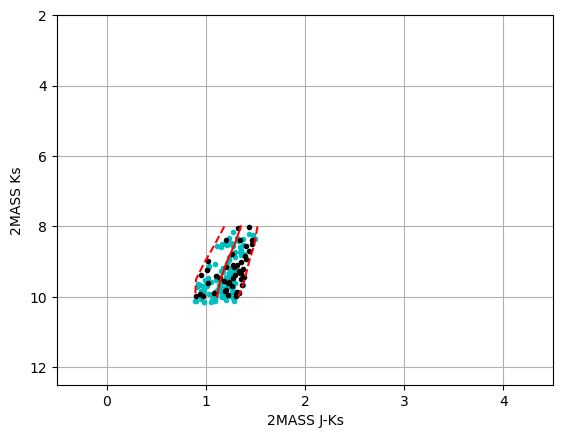

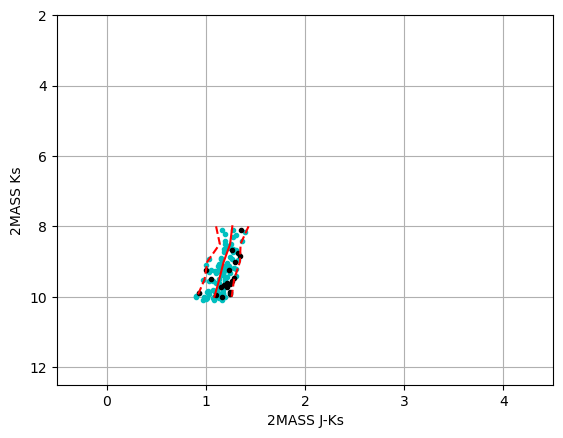

In [32]:
binrange = [7.75, 10.25]
kbins = [7.75, 8.25, 8.75, 9.25, 9.75, 10.25]
# this SHOULD make the bin centers 8.0, 8.5, 9.0, 9.5, and 10.0

for i, row in brava_main.iterrows():
    l = row['l_deg']
    b = row['b_deg']
    
    synth = pd.read_csv(f"{catdir}/BRAVA_test_l{l:0.3f}_b{b:0.3f}.csv", sep=r'\s+', header=0)
    synth = synth[(synth['2MASS_Ks'] >= 8.0) & (synth['2MASS_Ks'] <= 10.0)]

    brava = pd.read_csv(f"{tabdir}/BRAVA_l{l:0.3f}_b{b:0.3f}.table", sep=r'\s+', header=0)
    
    means, edges, binno = binned_statistic(brava['K'], brava['J']-brava['K'], statistic='mean', bins=kbins, range=binrange)
    sigmas, _, _ = binned_statistic(brava['K'], brava['J']-brava['K'], statistic='std', bins=kbins, range=binrange)
    
    mag_centers = 0.5*(edges[1:]+edges[:-1])
    mags = np.arange(np.min(mag_centers), np.max(mag_centers)+0.01, 0.01)
    
    mag_int = interp1d(mag_centers, means)
    std_int = interp1d(mag_centers, sigmas)
    
    synth_cut = synth[np.abs((synth['2MASS_J']-synth['2MASS_Ks'] - mag_int(synth['2MASS_Ks']))) < 2*std_int(synth['2MASS_Ks'])]
    
    mean_colors = mag_int(mags)
    std_colors = std_int(mags)
    
    fig, ax = plt.subplots()
    ax.plot(brava['J']-brava['K'], brava['K'], 'c.', label='BRAVA')
    ax.plot(synth_cut['2MASS_J']-synth_cut['2MASS_Ks'], synth_cut['2MASS_Ks'], 'k.', label='SP')
    ax.plot(mean_colors, mags, 'r-', label='Mean')
    ax.plot(mean_colors+2*std_colors, mags, 'r--')
    ax.plot(mean_colors-2*std_colors, mags, 'r--')
    ax.grid()
    ax.set_xlabel('2MASS J-Ks')
    ax.set_xlim(-0.5, 4.5)
    ax.set_ylabel('2MASS Ks')
    ax.set_ylim(2.0, 12.5)
    ax.invert_yaxis()

### Turn that Into a Function and Add to Other Plotting

In [33]:
def calc_color_cut(brava_df, binrange=[7.75, 10.25], binedges=[7.75, 8.25, 8.75, 9.25, 9.75, 10.25]):
    
    means, edges, _ = binned_statistic(brava_df['K'], brava_df['J']-brava_df['K'], statistic='mean', bins=binedges, range=binrange)
    sigmas, _, _ = binned_statistic(brava_df['K'], brava_df['J']-brava_df['K'], statistic='std', bins=binedges, range=binrange)
    
    mag_centers = 0.5*(edges[1:]+edges[:-1])
    
    mag_int = interp1d(mag_centers, means)
    std_int = interp1d(mag_centers, sigmas)
    return mag_int, std_int

/tmp/slurmtmp.8923088/ipykernel_1960861/2662612857.py:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 3, figsize=(17,6))


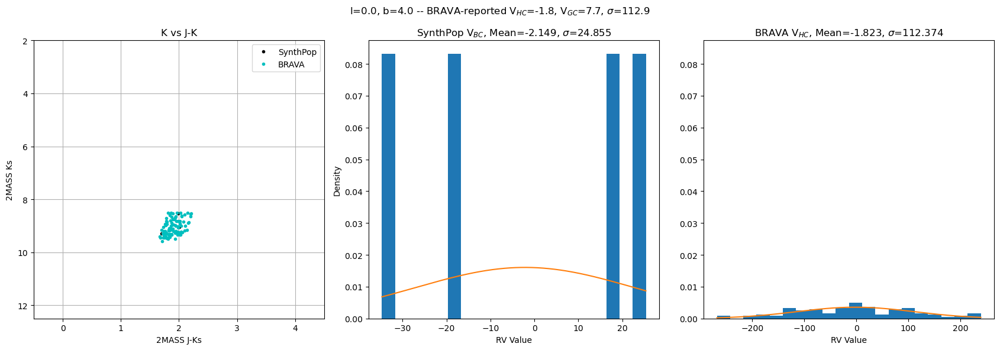

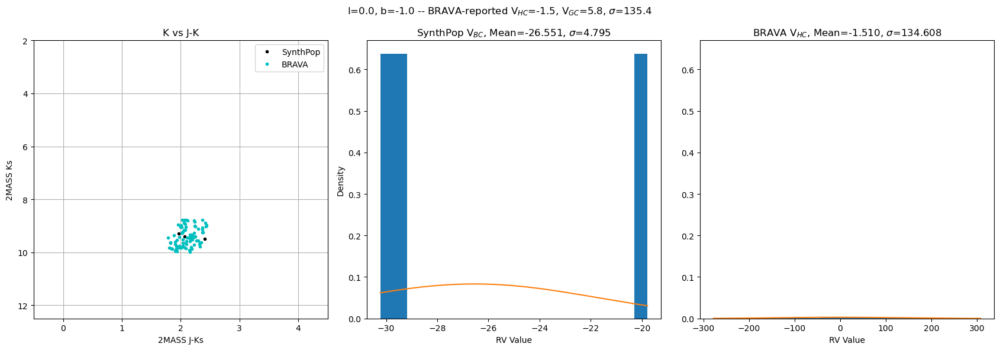

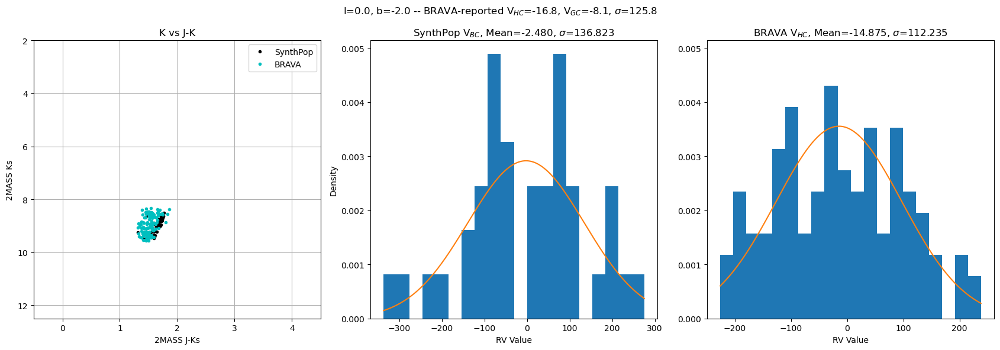

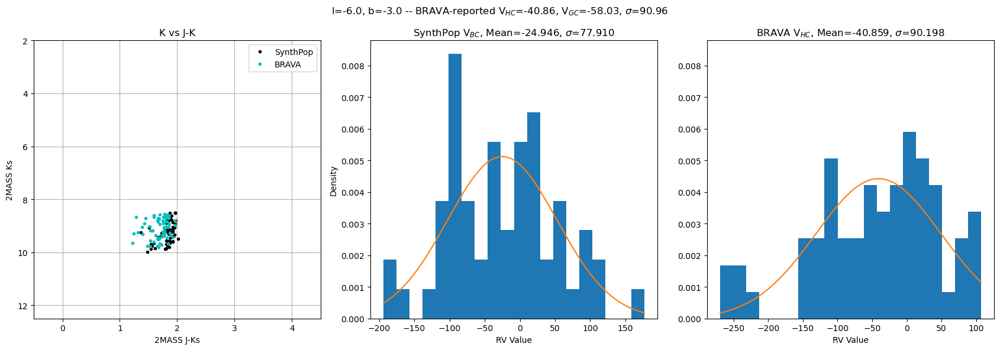

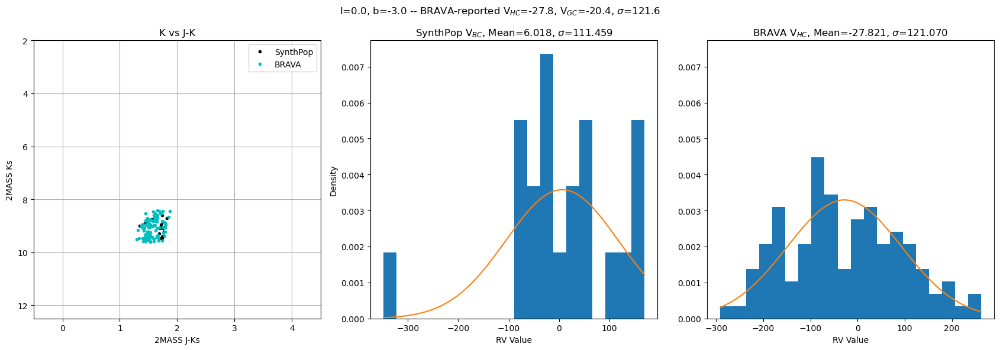

...

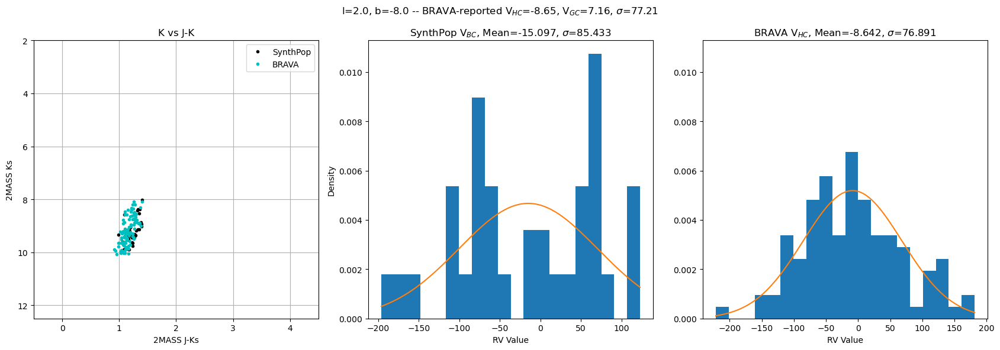

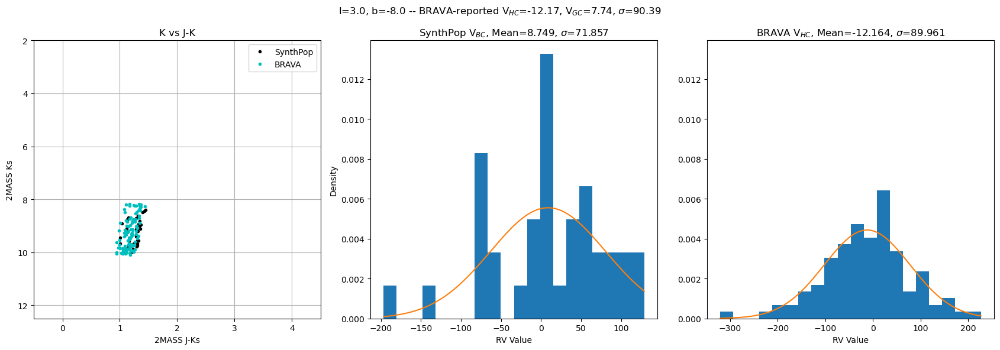

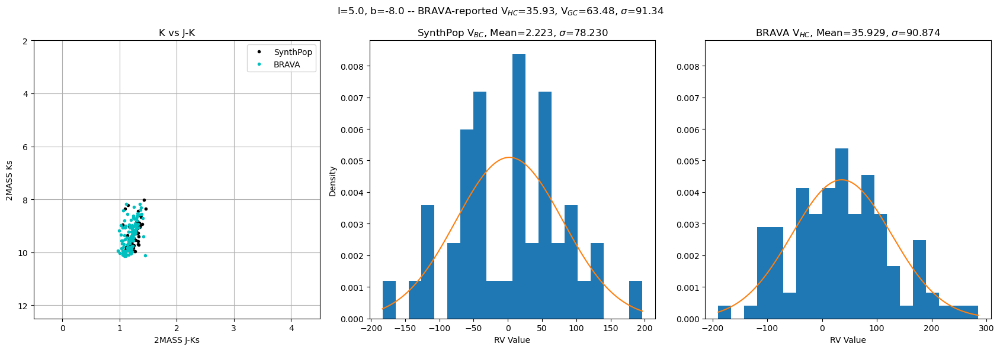

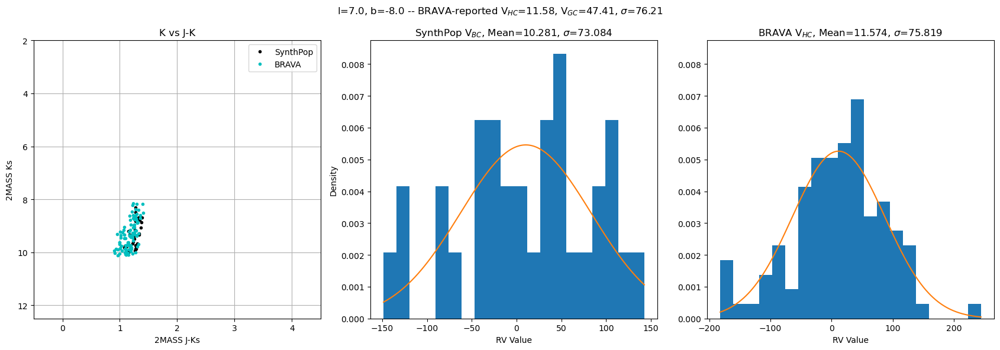

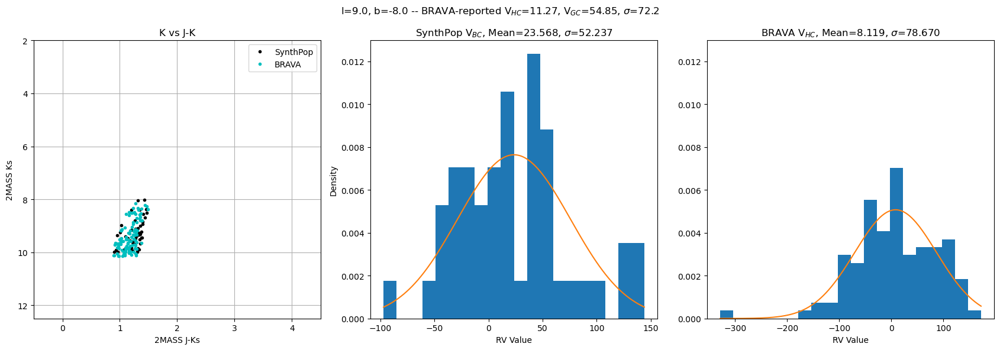

In [34]:
bad = []
rv_dict_colorcut = {}
for i, row in brava_main.iterrows():
    l = row['l_deg']
    b = row['b_deg']
    
    from_combined = full_brava[(full_brava['l_round']==l) & (full_brava['b_round']==b)]
    if from_combined.shape[0] > 1:
        main_N = row['Nb']
        from_combined = from_combined[from_combined['N_reliable_vel']==main_N]
    
    if from_combined.shape[0] == 0:
        bad.append(f"{l}_{b}")
        continue
    
    from_combined.reset_index(drop=True, inplace=True)
    reported_vhc = from_combined['V_hc'][0]
    reported_vgc = from_combined['V_gc'][0]
    reported_verr = from_combined['err_V'][0]
    reported_sigma = from_combined['sigma'][0]
    reported_sigerr = from_combined['err_sigma'][0]
    
    
    synth = pd.read_csv(f"{catdir}/BRAVA_test_l{l:0.3f}_b{b:0.3f}.csv", sep=r'\s+', header=0)
    synth = synth[(synth['2MASS_Ks'] >= 8.0) & (synth['2MASS_Ks'] <= 10.0)]
    
    brava = pd.read_csv(f"{tabdir}/BRAVA_l{l:0.3f}_b{b:0.3f}.table", sep=r'\s+', header=0)

    mags = np.arange(np.min(mag_centers), np.max(mag_centers)+0.01, 0.01)
    mag_int, std_int = calc_color_cut(brava)
    synth = synth[np.abs((synth['2MASS_J']-synth['2MASS_Ks'] - mag_int(synth['2MASS_Ks']))) < 2*std_int(synth['2MASS_Ks'])]
    
    mean_colors = mag_int(mags)
    std_colors = std_int(mags)
    
    mean_v_synth, mean_sig_synth = norm.fit(synth['vr_bc'])
    xs_synth = np.linspace(synth['vr_bc'].min(), synth['vr_bc'].max(), 1000)
    pdf_synth = norm.pdf(xs_synth, mean_v_synth, mean_sig_synth)
    
    mean_v_brava, mean_sig_brava = norm.fit(brava['Vhc_kmps'])
    xs_brava = np.linspace(brava['Vhc_kmps'].min(), brava['Vhc_kmps'].max(), 1000)
    pdf_brava = norm.pdf(xs_brava, mean_v_brava, mean_sig_brava)
    
    entry = {'l': l, 'b': b, 'brava_vhc': reported_vhc, 'brava_vgc': reported_vgc, 'brava_Verr': reported_verr,
             'brava_sigma': reported_sigma, 'brava_sigerr': reported_sigerr, 
             'synth_vbc': mean_v_synth, 'synth_sigma': mean_sig_synth}
    rv_dict_colorcut[i] = entry
    
    fig, axs = plt.subplots(1, 3, figsize=(17,6))
    fig.suptitle(f"l={l:0.1f}, b={b:0.1f} -- BRAVA-reported {vhcstr}={reported_vhc}, {vgcstr}={reported_vgc}, {dispstr}={reported_sigma}")
    axs[0].set_title('K vs J-K')
    axs[0].plot(synth.loc[:,'2MASS_J']-synth.loc[:,'2MASS_Ks'], synth.loc[:,'2MASS_Ks'], 'k.', label='SynthPop')
    axs[0].plot(brava.loc[:,'J']-brava.loc[:,'K'], brava.loc[:,'K'], 'c.', label='BRAVA')
    ax.plot(mean_colors, mags, 'r-', label='Mean BRAVA Color')
    ax.plot(mean_colors+2*std_colors, mags, 'r--')
    ax.plot(mean_colors-2*std_colors, mags, 'r--')
    axs[0].grid()
    axs[0].set_xlabel('2MASS J-Ks')
    axs[0].set_xlim(-0.5, 4.5)
    axs[0].set_ylabel('2MASS Ks')
    axs[0].set_ylim(2.0, 12.5)
    axs[0].invert_yaxis()
    axs[0].legend()
    
    axs[1].set_title(f"SynthPop {vbcstr}, Mean={mean_v_synth:0.3f}, {dispstr}={mean_sig_synth:0.3f}")
    axs[1].hist(synth.loc[:,'vr_bc'], bins=20, density=True)
    axs[1].plot(xs_synth, pdf_synth)
    axs[1].set_xlabel('RV Value')
    axs[1].set_ylabel('Density')
    
    axs[2].set_title(f"BRAVA {vhcstr}, Mean={mean_v_brava:0.3f}, {dispstr}={mean_sig_brava:0.3f}")
    axs[2].hist(brava.loc[:,'Vhc_kmps'], bins=20, density=True)
    axs[2].plot(xs_brava, pdf_brava)
    axs[2].set_xlabel('RV Value')
    
    axs[1].sharey(axs[2])
    
    plt.tight_layout()
    plt.savefig(f"{plotdir}/synth_brava_l{l:0.3f}_b{b:0.3f}_cmd_hist.png")
    # sys.breakpoint()
    # plt.close()

In [35]:
rv_dict_colorcut = pd.DataFrame.from_dict(rv_dict_colorcut, orient='index')
display(rv_dict_colorcut)

,l,b,brava_vhc,brava_vgc,brava_Verr,brava_sigma,brava_sigerr,synth_vbc,synth_sigma
0,0.0,4.0,-1.80,7.70,11.60,112.90,8.20,-2.148632,24.854597
1,0.0,-1.0,-1.50,5.80,15.00,135.40,10.60,-26.550641,4.794815
2,0.0,-2.0,-16.80,-8.10,12.10,125.80,8.60,-2.480496,136.823450
3,-6.0,-3.0,-40.86,-58.03,11.46,90.96,8.10,-24.946063,77.909625
4,0.0,-3.0,-27.80,-20.40,11.90,121.60,8.40,6.018004,111.459085
5,6.0,-3.0,26.54,57.80,8.95,83.02,6.33,6.004575,66.830358
6,-10.0,-4.0,-66.90,98.60,9.30,84.10,6.60,-17.651499,69.374945
7,-9.0,-4.0,-35.50,-63.40,8.30,79.70,5.80,-5.614468,103.060102
9,-7.0,-4.0,-62.60,-82.20,8.50,85.70,6.00,-14.203246,84.614332
10,-6.0,-4.0,-44.60,-60.40,8.90,88.60,6.30,-7.329638,83.592355


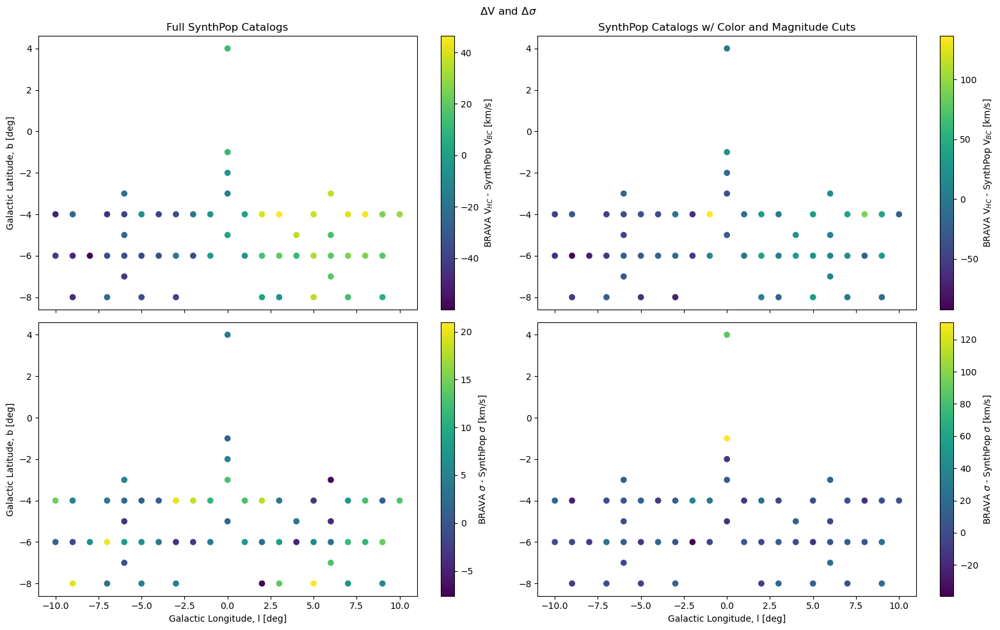

In [36]:
fig, axs = plt.subplots(2, 2, sharex=True, figsize=(16,10))
fig.suptitle(r'$\Delta$V and $\Delta\sigma$')
axs[0,0].set_title('Full SynthPop Catalogs')
sc00 = axs[0,0].scatter(rv_df['l'], rv_df['b'], c=rv_df['brava_vhc']-rv_df['synth_vbc'])#, cmap=cmap, norm=cmap_norm)
axs[0,0].set_ylabel("Galactic Latitude, b [deg]")

axs[0,1].set_title('SynthPop Catalogs w/ Color and Magnitude Cuts')
sc01 = axs[0,1].scatter(rv_dict_colorcut['l'], rv_dict_colorcut['b'], c=rv_dict_colorcut['brava_vhc']-rv_dict_colorcut['synth_vbc'])#, cmap=cmap, norm=cmap_norm)

sc10 = axs[1, 0].scatter(rv_df['l'], rv_df['b'], c=rv_df['brava_sigma']-rv_df['synth_sigma'])#, cmap=cmap, norm=cmap_norm)
axs[1,0].set_xlabel("Galactic Longitude, l [deg]")
axs[1,0].set_ylabel("Galactic Latitude, b [deg]")

sc11 = axs[1,1].scatter(rv_dict_colorcut['l'], rv_dict_colorcut['b'], c=rv_dict_colorcut['brava_sigma']-rv_dict_colorcut['synth_sigma'])#, cmap=cmap, norm=cmap_norm)
axs[1,1].set_xlabel("Galactic Longitude, l [deg]")


plt.colorbar(sc00, label=f'BRAVA {vhcstr} - SynthPop {vbcstr} [km/s]')
plt.colorbar(sc01, label=f'BRAVA {vhcstr} - SynthPop {vbcstr} [km/s]')
plt.colorbar(sc10, label=f'BRAVA {dispstr} - SynthPop {dispstr} [km/s]')
plt.colorbar(sc11, label=f'BRAVA {dispstr} - SynthPop {dispstr} [km/s]')
plt.tight_layout()